<a href="https://colab.research.google.com/github/ImronRosada/Data_Science/blob/main/FinPro_Credit_Card_Bank_Customer_Analysis_and_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

IMRON ROSADA<BR>
DATA SCIENCE<BR>
CREDIT CARD CUSTOMER ANALYSIS AND PREDICTION<BR>


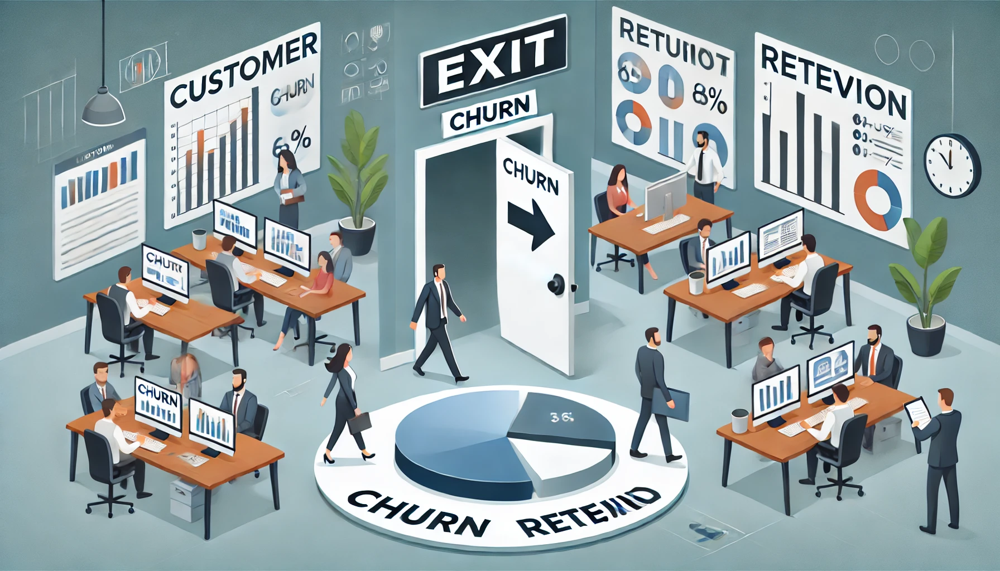

## `DATA UNDERSTANDING`

Mengeksplorasi data untuk mendapatkan wawasan awal serta memastikan kualitas data.

Seorang manajer di bank merasa terganggu dengan semakin banyaknya pelanggan yang meninggalkan layanan kartu kredit mereka. Mereka akan sangat menghargai jika seseorang dapat memprediksi siapa saja yang akan berhenti menggunakan kartu kredit mereka sehingga mereka dapat secara proaktif mendatangi pelanggan untuk memberikan layanan yang lebih baik dan mengubah keputusan pelanggan ke arah yang berlawanan.

**Deskripsi Variabel**  

Dataset memiliki **10.127** entri dan **21** kolom, termasuk:  

| **Nama Kolom**                 | **Deskripsi** |
|--------------------------------|--------------|
| **CLIENTNUM**                  | ID unik pelanggan |
| **Attrition_Flag**              | Status pelanggan (Existing = Aktif, Attrited = Berhenti) (Variabel target) |
| **Customer_Age**                | Usia pelanggan |
| **Gender**                      | Jenis kelamin pelanggan (M = Laki-laki, F = Perempuan) |
| **Dependent_Count**             | Jumlah tanggungan pelanggan |
| **Education_Level**             | Tingkat pendidikan pelanggan |
| **Marital_Status**              | Status pernikahan pelanggan |
| **Income_Category**             | Kategori pendapatan pelanggan |
| **Card_Category**               | Jenis kartu yang digunakan pelanggan |
| **Months_On_Book**              | Lama menjadi pelanggan (dalam bulan) |
| **Total_Relationship_Count**    | Jumlah produk yang digunakan pelanggan di bank |
| **Months_Inactive_12_Mon**      | Lama tidak aktif dalam 12 bulan terakhir |
| **Contacts_Count_12_Mon**       | Jumlah interaksi antara pelanggan dan bank dalam 12 bulan terakhir |
| **Credit_Limit**                | Batas nominal transaksi kartu kredit dalam satu periode |
| **Total_Revolving_Bal**         | Total saldo kredit yang belum dibayar dalam satu periode |
| **Avg_Open_To_Buy**             | Selisih antara batas kredit yang diberikan dan saldo saat ini |
| **Total_Amt_Chng_Q4_Q1**        | Perubahan nominal total pembelanjaan pelanggan antara Kuartal 4 dan Kuartal 1 |
| **Total_Trans_Amt**             | Total jumlah uang yang dibelanjakan dalam 12 bulan terakhir |
| **Total_Trans_Ct**              | Jumlah total transaksi yang dilakukan dalam 12 bulan terakhir |
| **Total_Ct_Chng_Q4_Q1**         | Perubahan jumlah transaksi pelanggan antara Kuartal 4 dan Kuartal 1 |
| **Avg_Utilization_Ratio**       | Persentase penggunaan kartu kredit |

Variabel **Attrition_Flag** merupakan target yang akan diprediksi.


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import scipy.stats as stats

### Load dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

# where is your data path
data_path = '/content/drive/My Drive/Colab Notebooks/Finpro-DS/'

Mounted at /content/drive/


In [ ]:
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.expand_frame_repr', False)
file_name = data_path + 'BankChurners.csv'

In [ ]:
df = pd.read_csv(file_name)
df_churn = df.copy()
df_churn.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


## `DATA PREPARATION`

Langkah-langkah yang dilakukan untuk memastikan data siap digunakan dalam analisis atau pembuatan model.

In [ ]:
df_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

- CLIENTNUM →  Sebagai ID pelanggan, fitur ini lebih tepat disimpan dalam format string (object) agar tidak diperlakukan sebagai variabel numerik bukan data yang digunakan untuk analisis pembuatan model jadi bisa diabaikan atau dihapus jika tidak diperlukan.
- Attrition_Flag, Gender, Education_Level, Marital_Status, Income_Category, Card_Category →  Fitur-fitur ini merupakan variabel kategorikal yang dapat dikonversi ke tipe category untuk efisiensi memori dan pemrosesan yang lebih optimal.
- Fitur Naive Bayes →  pada dua kolom terakhir kemungkinan merupakan hasil prediksi dari model yang telah diterapkan sebelumnya. Pada penelitian ini, kedua fitur tersebut akan dihapus untuk mencegah data leakage dalam pembangunan model.

In [ ]:
# Ubah tipe data CLIENTNUM menjadi string
df_churn["CLIENTNUM"] = df_churn["CLIENTNUM"].astype(str)

# Ubah tipe data kolom kategori menjadi category
categorical_cols = ["Attrition_Flag", "Gender", "Education_Level", "Marital_Status", "Income_Category", "Card_Category"]
df_churn[categorical_cols] = df_churn[categorical_cols].astype("category")

# Hapus dua fitur Naive Bayes
df_churn.drop(columns=[
    "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1",
    "Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2"
], inplace=True)

In [ ]:
df_churn.dtypes

,0
CLIENTNUM,object
Attrition_Flag,category
Customer_Age,int64
Gender,category
Dependent_count,int64
Education_Level,category
Marital_Status,category
Income_Category,category
Card_Category,category
Months_on_book,int64


In [ ]:
# Numerik (Int dan Float)
numerik = [
    'Customer_Age', 'Dependent_count', 'Months_on_book',
    'Total_Relationship_Count', 'Months_Inactive_12_mon',
    'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
    'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
    'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'
]

# Kategorik
kategorik = [
    'CLIENTNUM', 'Attrition_Flag', 'Gender', 'Education_Level',
    'Marital_Status', 'Income_Category', 'Card_Category'
]

### Duplicate Handling

In [ ]:
len(df_churn.drop_duplicates()) / len(df_churn)

1.0

In [ ]:
duplicates = df_churn[df_churn.duplicated(keep=False)]
print("Baris dengan duplikat:")
duplicates

Baris dengan duplikat:


,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio


Nilai pada tabel `kosong` menandakan tidak ada baris yang duplikat

### Missing Value Handling

In [ ]:
df_churn[df_churn.isna().any(axis=1)]

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio


In [ ]:
total_rows = len(df_churn)

for column in df_churn.columns:
   # if column != 'customerID':
        missing_count = df_churn[column].isna().sum()
        missing_percentage = (missing_count / total_rows) * 100
        print(f"Column '{column}' Has {missing_count} missing values ({missing_percentage:.2f}%)") # .2f means 2 decimal

Column 'CLIENTNUM' Has 0 missing values (0.00%)
Column 'Attrition_Flag' Has 0 missing values (0.00%)
Column 'Customer_Age' Has 0 missing values (0.00%)
Column 'Gender' Has 0 missing values (0.00%)
Column 'Dependent_count' Has 0 missing values (0.00%)
Column 'Education_Level' Has 0 missing values (0.00%)
Column 'Marital_Status' Has 0 missing values (0.00%)
Column 'Income_Category' Has 0 missing values (0.00%)
Column 'Card_Category' Has 0 missing values (0.00%)
Column 'Months_on_book' Has 0 missing values (0.00%)
Column 'Total_Relationship_Count' Has 0 missing values (0.00%)
Column 'Months_Inactive_12_mon' Has 0 missing values (0.00%)
Column 'Contacts_Count_12_mon' Has 0 missing values (0.00%)
Column 'Credit_Limit' Has 0 missing values (0.00%)
Column 'Total_Revolving_Bal' Has 0 missing values (0.00%)
Column 'Avg_Open_To_Buy' Has 0 missing values (0.00%)
Column 'Total_Amt_Chng_Q4_Q1' Has 0 missing values (0.00%)
Column 'Total_Trans_Amt' Has 0 missing values (0.00%)
Column 'Total_Trans_Ct'

Missing values `0.00%` yang berarti tidak ada nilai yang hilang di dalam dataset

In [ ]:
df_missing_text = df_churn.select_dtypes(include=['object', 'category']).melt(var_name="Kolom", value_name="Tipe")
df_missing_text = df_missing_text[df_missing_text["Tipe"].astype(str).str.strip().isin(['NaN', 'Unknown', '<NaN>', 'N/A', 'None', 'null'])]
df_missing_text = df_missing_text.groupby(["Kolom", "Tipe"]).size().reset_index(name="Jumlah Data")
df_missing_text["Persentase (%)"] = (df_missing_text["Jumlah Data"] / len(df_churn)) * 100
df_missing_text

,Kolom,Tipe,Jumlah Data,Persentase (%)
0,Education_Level,Unknown,1519,14.999506
1,Income_Category,Unknown,1112,10.980547
2,Marital_Status,Unknown,749,7.396070


Terdeteksi sebagai missing values berbasis teks (**Unknown**)

-   `Unknown` memiliki proporsi yang signifikan dalam dataset dan menghapusnya dapat menyebabkan hilangnya informasi penting.
-   Data `Unknown` mungkin merepresentasikan kelompok yang memiliki karakteristik unik, seperti individu yang tidak memberikan informasi atau kondisi tertentu yang relevan.
-   Membiarkan nilai `Unknown` sebagai kategori memungkinkan analisis yang lebih transparan dan komprehensif tanpa memperkenalkan asumsi tambahan melalui imputasi.

Jika nanti saat modeling kategori "Unknown" tidak terlalu berpengaruh, bisa dipertimbangkan untuk dibuang atau diubah menjadi Missing (NaN) lalu diimputasi.

### Outlier Handling


In [ ]:
from scipy import stats
def check_plot(df_churn, variable):

    plt.figure(figsize=(16, 4))

    # histogram
    plt.subplot(1, 3, 1)
    sns.histplot(df_churn[variable], bins=30)
    plt.title('Histogram')

    # plot Q-Q
    plt.subplot(1, 3, 2)
    stats.probplot(df_churn[variable], dist="norm", plot=plt)
    plt.ylabel('Variable quantiles')

    # box plot
    plt.subplot(1, 3, 3)
    sns.boxplot(y=df_churn[variable])
    plt.title('Boxplot')
    plt.show()

In [ ]:
print(numerik)

['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']


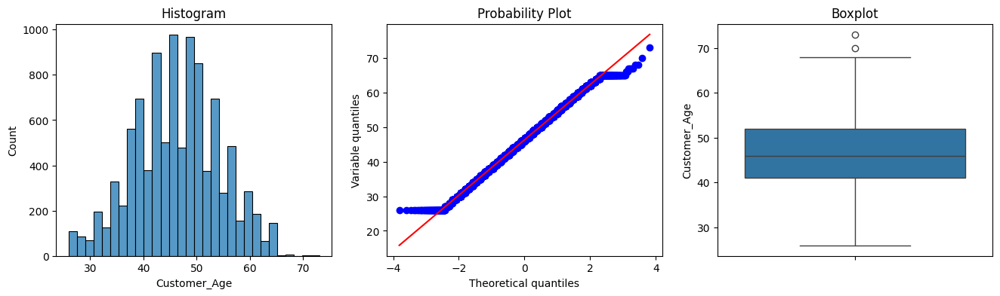

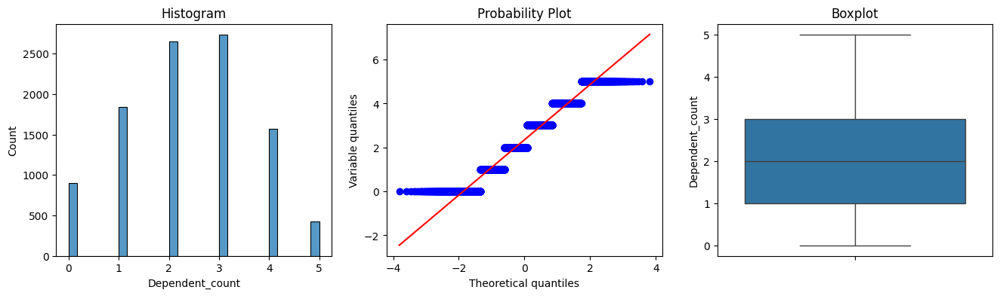

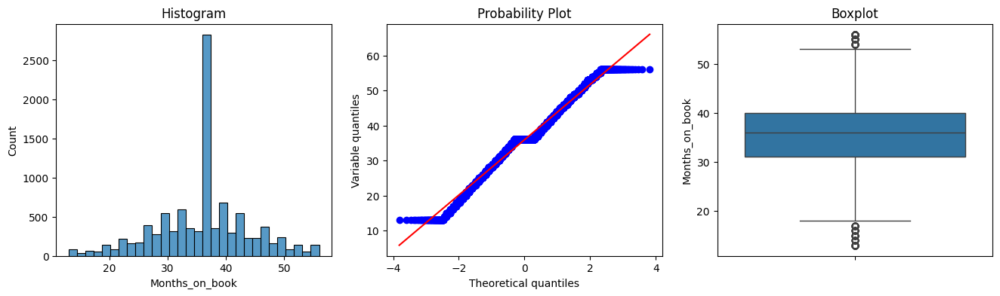

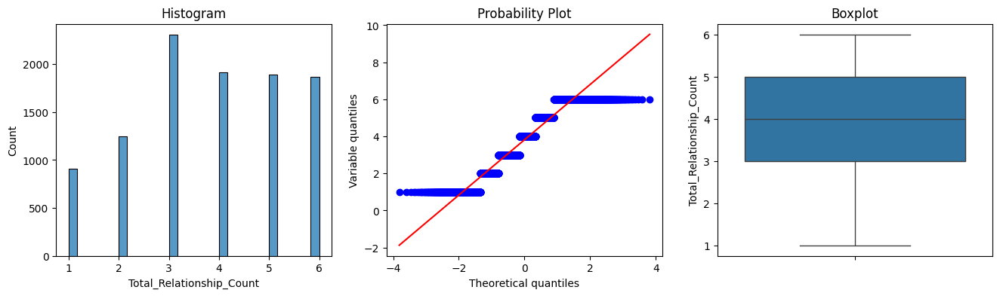

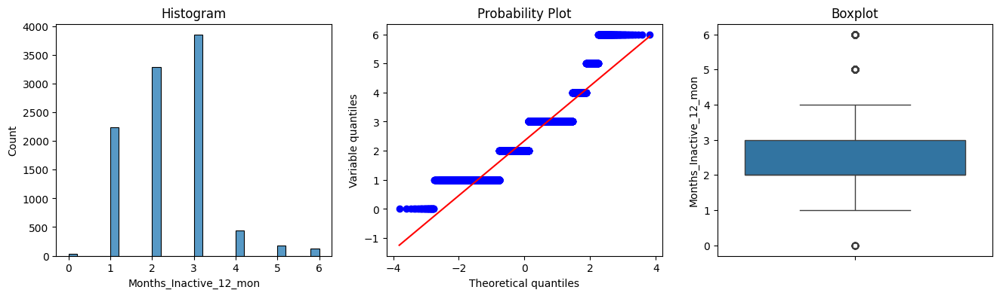

...

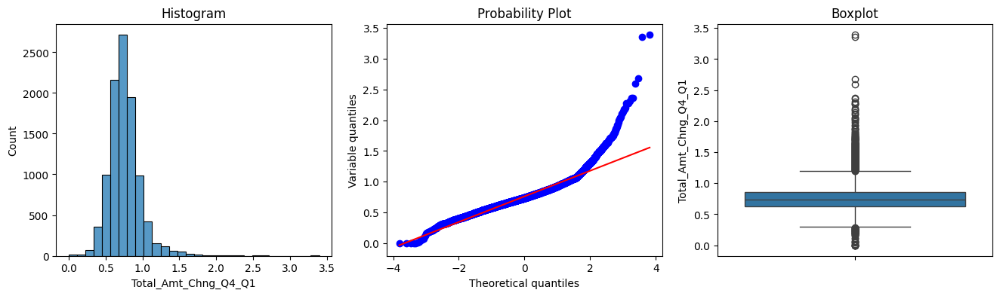

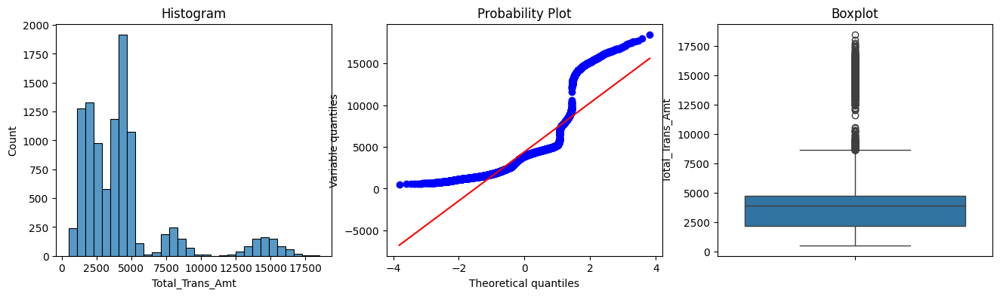

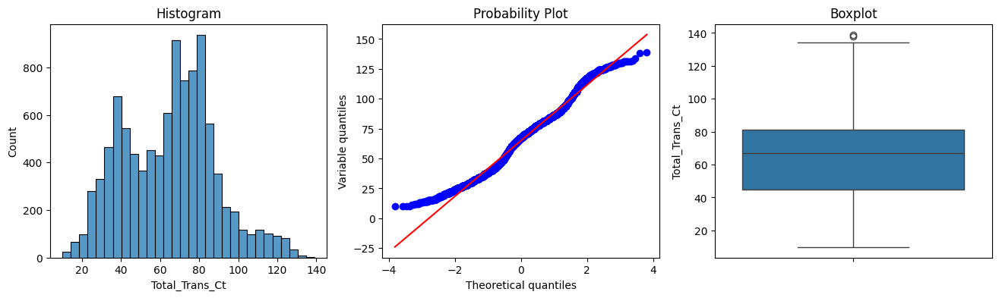

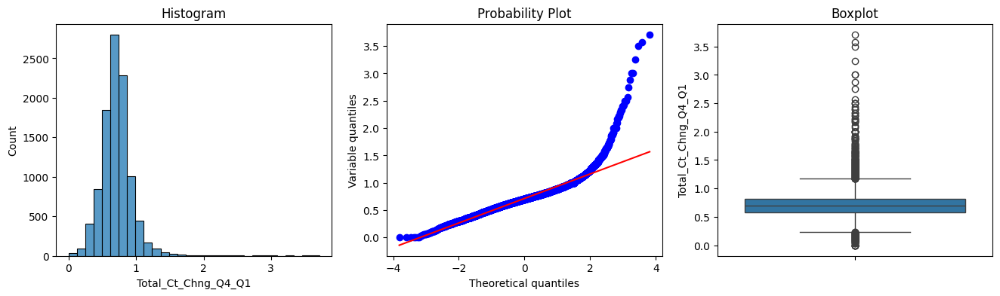

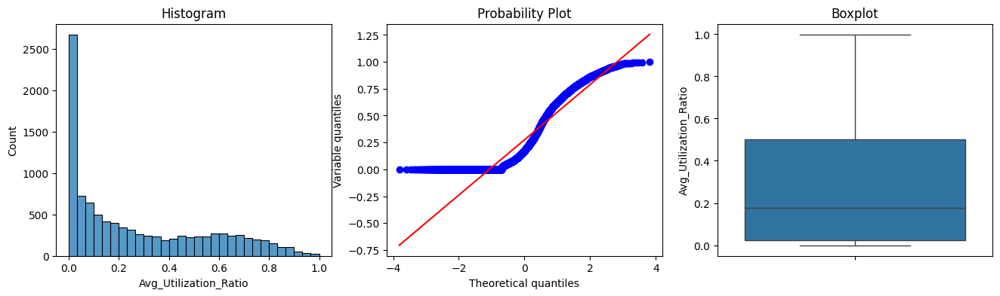

In [ ]:
# Memvisualisasikan outlier
for kolom in ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']:
    df_churn = df_churn.copy()
    check_plot(df_churn, kolom)

In [ ]:
def calc_outliers(df_churn, column):
    q1 = df_churn[column].quantile(0.25)
    q3 = df_churn[column].quantile(0.75)
    iqr = q3 - q1
    upper_fence = q3 + 1.5 * iqr
    lower_fence = q1 - 1.5 * iqr

    print(f"\n[{column}]")
    print(f"Q1: {q1:.2f}, Median: {df_churn[column].median():.2f}, Q3: {q3:.2f}")
    print(f"Upper Fence: {upper_fence:.2f}, Lower Fence: {lower_fence:.2f}")
    print(f"Min: {df_churn[column].min():.2f}, Max: {df_churn[column].max():.2f}")

    outliers_upper = df_churn[df_churn[column] > upper_fence][column]
    outliers_lower = df_churn[df_churn[column] < lower_fence][column]

    print(f"Outliers di atas Upper Fence: {list(outliers_upper)}")
    print(f"Outliers di bawah Lower Fence: {list(outliers_lower)}")

# Daftar kolom yang akan dicek
columns_to_check = ['Customer_Age', 'Dependent_count', 'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio']

for col in columns_to_check:
    calc_outliers(df_churn, col)


[Customer_Age]
Q1: 41.00, Median: 46.00, Q3: 52.00
Upper Fence: 68.50, Lower Fence: 24.50
Min: 26.00, Max: 73.00
Outliers di atas Upper Fence: [73, 70]
Outliers di bawah Lower Fence: []

[Dependent_count]
Q1: 1.00, Median: 2.00, Q3: 3.00
Upper Fence: 6.00, Lower Fence: -2.00
Min: 0.00, Max: 5.00
Outliers di atas Upper Fence: []
Outliers di bawah Lower Fence: []

[Months_on_book]
Q1: 31.00, Median: 36.00, Q3: 40.00
Upper Fence: 53.50, Lower Fence: 17.50
Min: 13.00, Max: 56.00
Outliers di atas Upper Fence: [54, 56, 56, 56, 54, 56, 56, 56, 54, 55, 56, 56, 54, 54, 56, 56, 56, 56, 56, 56, 56, 56, 56, 56, 54, 54, 56, 54, 54, 55, 54, 56, 56, 56, 56, 56, 56, 56, 54, 54, 56, 56, 55, 55, 54, 54, 55, 56, 56, 55, 55, 56, 56, 54, 55, 55, 56, 56, 54, 56, 54, 56, 55, 56, 56, 56, 54, 56, 55, 56, 56, 56, 56, 56, 56, 56, 56, 55, 54, 54, 56, 55, 56, 56, 56, 56, 54, 55, 54, 56, 56, 54, 54, 55, 54, 55, 56, 56, 56, 55, 56, 56, 56, 55, 54, 54, 56, 55, 56, 56, 55, 56, 56, 54, 56, 56, 56, 56, 56, 56, 54, 56, 

In [ ]:
def check_outliers_zscore(df, column, window=100, threshold=2.5):
    df["rolling_mean"] = df[column].rolling(window=window, center=True).mean()
    df["rolling_std"] = df[column].rolling(window=window, center=True).std()

    df["z_score"] = (df[column] - df["rolling_mean"]) / df["rolling_std"]

    outliers = df[(df["z_score"].abs() > threshold)]
    print(f"\n[{column}]")
    print(f"Jumlah outlier: {len(outliers)}")
    print(outliers[[column, "z_score"]].head())

for col in ['Months_on_book', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Ct_Chng_Q4_Q1', ]:
    check_outliers_zscore(df_churn, col)


[Months_on_book]
Jumlah outlier: 139
     Months_on_book   z_score
67               20 -2.624094
108              56  2.615627
151              56  2.511958
514              13 -2.776977
521              13 -2.820821

[Months_Inactive_12_mon]
Jumlah outlier: 221
     Months_Inactive_12_mon   z_score
118                       6  3.465257
163                       5  2.822524
201                       5  2.843413
202                       5  2.824592
313                       6  3.821855

[Contacts_Count_12_mon]
Jumlah outlier: 106
      Contacts_Count_12_mon   z_score
900                       0 -2.509602
915                       0 -2.578951
983                       0 -2.629453
995                       0 -2.679783
1000                      0 -2.689259

[Credit_Limit]
Jumlah outlier: 339
     Credit_Limit   z_score
229       34516.0  2.541505
260       34516.0  2.525871
280       34516.0  2.696048
303       34516.0  2.636596
321       34516.0  2.506003

[Avg_Open_To_Buy]
Jumlah outli

In [ ]:
# drop kolom hasil outlier
df_churn = df_churn.drop(columns=['rolling_mean', 'rolling_std', 'z_score'])

| **Variabel**                 | **Penanganan**  | **Justifikasi**  |
|------------------------------|------------------------|------------------|
| **Months_on_book**           | Masih Valid  | Pelanggan dengan lama kepemilikan kartu ekstrem (terlalu baru atau lama) masih logis. |
| **Months_Inactive_12_mon**   | Perlu Ditinjau        | Pelanggan yang sangat lama tidak aktif bisa menjadi indikator churn atau kesalahan data. |
| **Contacts_Count_12_mon**    | Perlu Ditinjau        | Tidak adanya kontak pelanggan dalam 12 bulan bisa disebabkan oleh berbagai faktor. |
| **Credit_Limit**             | Masih Valid   | Batas kredit tinggi wajar untuk segmen pelanggan tertentu. |
| **Avg_Open_To_Buy**          | Masih Valid   | Sama dengan Credit_Limit, ini wajar untuk pelanggan premium. |
| **Total_Amt_Chng_Q4_Q1**     | Perlu Ditinjau        | Perubahan transaksi yang ekstrem bisa menunjukkan tren musiman atau anomali. |
| **Total_Trans_Amt**          | Masih Valid   | Nilai transaksi besar masih relevan dalam analisis pelanggan. |
| **Total_Ct_Chng_Q4_Q1**      | Perlu Ditinjau        | Perubahan jumlah transaksi yang drastis bisa menandakan perubahan perilaku pelanggan. |

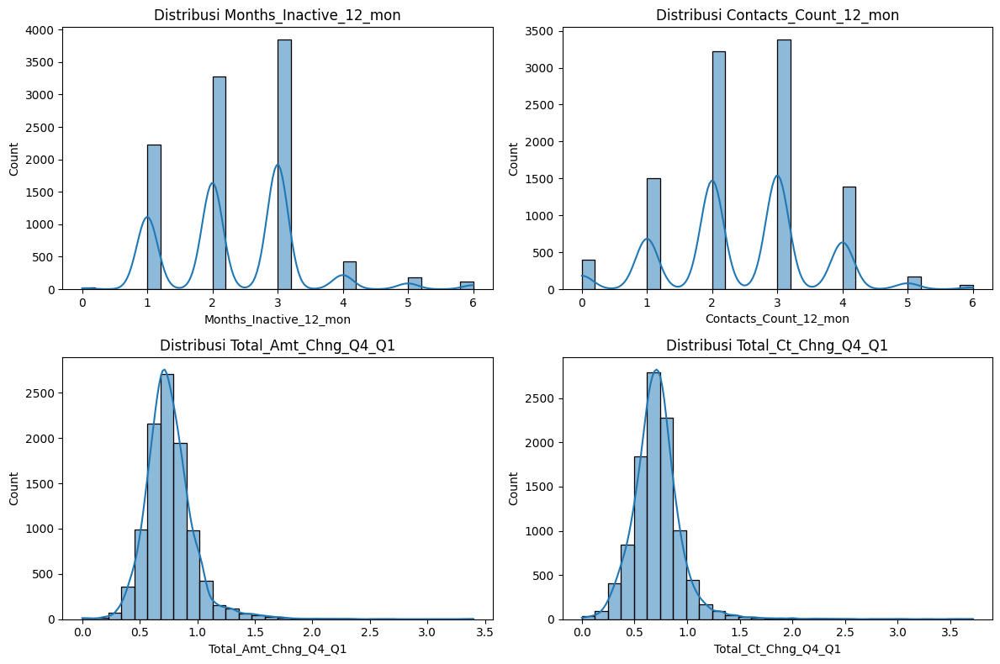

In [ ]:
columns_to_check = ["Months_Inactive_12_mon", "Contacts_Count_12_mon", "Total_Amt_Chng_Q4_Q1", "Total_Ct_Chng_Q4_Q1"]

plt.figure(figsize=(12, 8))
for i, col in enumerate(columns_to_check, 1):
    plt.subplot(2, 2, i)
    sns.histplot(df_churn[col], bins=30, kde=True)
    plt.title(f"Distribusi {col}")
plt.tight_layout()
plt.show()

- Months_Inactive_12_mon & Contacts_Count_12_mon → Distribusi diskrit dengan puncak di nilai tertentu, bersifat kategori ordinal. menunjukkan bahwa sebagian besar pelanggan memiliki jumlah bulan tidak aktif atau kontak yang terbatas. Outlier masih masuk akal.

- Total_Amt_Chng_Q4_Q1 & Total_Ct_Chng_Q4_Q1 → Distribusi normal tetapi ada skewness ringan ke kanan. Ada ekor panjang di bagian kanan, yang mungkin mengindikasikan segmen pelanggan dengan aktivitas transaksi lebih tinggi. Outlier disini tidak terlihat extreme.

In [ ]:
# Uji Chi-Square untuk variabel diskrit/kategorik ordinal
for col in ["Months_Inactive_12_mon", "Contacts_Count_12_mon"]:
    contingency_table = pd.crosstab(df_churn[col], df_churn["Attrition_Flag"])
    chi2, p, _, _ = stats.chi2_contingency(contingency_table)
    print(f"{col}: Chi-Square={chi2:.3f}, p-value={p}")


Months_Inactive_12_mon: Chi-Square=396.456, p-value=1.6155198022594863e-82
Contacts_Count_12_mon: Chi-Square=586.638, p-value=1.7769862229780962e-123


Months_Inactive_12_mon dan Contacts_Count_12_mon (kategori, uji Chi-Square) → Pelanggan yang lebih lama tidak aktif dan jarang berinteraksi dengan bank memiliki kemungkinan churn lebih tinggi.

In [ ]:
df_churn["Attrition_Flag"] = df_churn["Attrition_Flag"].map({"Existing Customer": 0, "Attrited Customer": 1}).astype(int)
# Point Biserial Correlation untuk variabel Numerik kontinu
for col in ["Total_Amt_Chng_Q4_Q1", "Total_Ct_Chng_Q4_Q1"]:
    corr, p = stats.pointbiserialr(df_churn[col], df_churn["Attrition_Flag"])
    print(f"{col}: Korelasi={corr:.3f}, p-value={p}")

Total_Amt_Chng_Q4_Q1: Korelasi=-0.131, p-value=4.836642703585021e-40
Total_Ct_Chng_Q4_Q1: Korelasi=-0.290, p-value=1.6477247846949955e-195


- Months_Inactive_12_mon dan Contacts_Count_12_mon (kategori, uji Chi-Square) → Pelanggan yang lebih lama tidak aktif dan jarang berinteraksi dengan bank memiliki kemungkinan churn lebih tinggi.
- Total_Amt_Chng_Q4_Q1 dan Total_Ct_Chng_Q4_Q1 (numerik kontinu, Point Biserial) → Semakin besar peningkatan jumlah dan frekuensi transaksi, semakin kecil kemungkinan churn.

Semua fitur memiliki p-value < 0.05, menunjukkan adanya hubungan yang signifikan dengan Attrition_Flag. Artinya, fitur-fitur ini berpengaruh terhadap churn dan penting untuk model, sehingga outlier akan di pertahankan.

### Feature Engineering

In [ ]:
# kembali ke bentuk awal untuk exploration data analysis
df_churn["Attrition_Flag"] = df_churn["Attrition_Flag"].map({0: "Existing Customer", 1: "Attrited Customer"})

In [ ]:
df_churn["Age_Group"] = pd.cut(df_churn["Customer_Age"], bins=[18, 39, 54, 100], labels=["Young", "Adult", "Senior"])
df_churn["Tenure_Group"] = pd.cut(df_churn["Months_on_book"], bins=[0, 12, 36, 60, 100], labels=["<1 Year", "1-3 Years", "3-5 Years", ">5 Years"], right=False)
df_churn["Credit_Limit_Category"] = pd.cut(df_churn["Credit_Limit"], bins=[0, 5000, 10000, 20000, df_churn["Credit_Limit"].max()], labels=["Low", "Medium", "High", "Very High"], right=False)
df_churn["Total_Revolving_Bal_Category"] = pd.cut(df_churn["Total_Revolving_Bal"], bins=[0, 359, 1276, 1784, 2517, df_churn["Total_Revolving_Bal"].max() + 1], labels=["Very Low", "Low", "Medium", "High", "Very High"], right=False)
df_churn["Avg_Open_To_Buy_Category"] = pd.cut(df_churn["Avg_Open_To_Buy"], bins=[0, 3474, 9859, 34516], labels=["Low_Open_To_Buy", "Medium_Open_To_Buy", "High_Open_To_Buy"], right=False)
df_churn['Avg_Utilization_Category'] = pd.cut(df_churn['Avg_Utilization_Ratio'], bins=[0, 0.25, 0.75, 1], labels=["Low Utilization", "Medium Utilization", "High Utilization"], right=False)
df_churn["Total_Amt_Chng_Q4_Q1_Category"] = pd.cut(df_churn["Total_Amt_Chng_Q4_Q1"], bins=[0, 0.63, 0.74, 0.86, 3.4], labels=["Low Amt Change", "Medium Amt Change", "High Amt Change", "Very High Amt Change"], right=False)
df_churn["Total_Ct_Chng_Q4_Q1_Category"] = pd.cut(df_churn["Total_Ct_Chng_Q4_Q1"], bins=[0, 0.58, 0.70, 0.82, 3.7], labels=["Low Ct Change", "Medium Ct Change", "High Ct Change", "Very High Ct Change"], right=False)
df_churn["Total_Trans_Amt_Category"] = pd.cut(df_churn["Total_Trans_Amt"], bins=[510, 2155, 4741, 18484], labels=["Low Spend", "Medium Spend", "High Spend"], right=False)
df_churn["Total_Trans_Ct_Category"] = pd.cut(df_churn["Total_Trans_Ct"], bins=[10, 45, 81, 139], labels=["Low Transactions", "Medium Transactions", "High Transactions"], right=False)

In [ ]:
# df_churn.to_csv(r'C:\Users\iProject\python\Data_Science\Bank_Card\dataset\df_churn_review.csv', index=False)

In [ ]:
df_churn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 31 columns):
 #   Column                         Non-Null Count  Dtype   
---  ------                         --------------  -----   
 0   CLIENTNUM                      10127 non-null  object  
 1   Attrition_Flag                 10127 non-null  object  
 2   Customer_Age                   10127 non-null  int64   
 3   Gender                         10127 non-null  category
 4   Dependent_count                10127 non-null  int64   
 5   Education_Level                10127 non-null  category
 6   Marital_Status                 10127 non-null  category
 7   Income_Category                10127 non-null  category
 8   Card_Category                  10127 non-null  category
 9   Months_on_book                 10127 non-null  int64   
 10  Total_Relationship_Count       10127 non-null  int64   
 11  Months_Inactive_12_mon         10127 non-null  int64   
 12  Contacts_Count_12_mon          1

**New Features:**<br>
- AgeGroup → Mengelompokkan pelanggan berdasarkan usia untuk melihat pola churn.
- TenureGroup → Mengelompokkan seberapa lama menjadi nasabah untuk memahami churn berdasarkan masa kepemilikan akun.
- Credit_Limit_Category → Mengelompokkan batas kredit untuk melihat kaitannya dengan churn.
- Total_Revolving_Bal_Category → Mengelompokan saldo kredit yang belum dibayar untuk memahami distribusi dan hubungannya dengan churn.
- Avg_Open_To_Buy_Category → Mengelompokan dana yang masih tersedia untuk dibelanjakan oleh pelanggan
- Avg_Utilization_Category → Mengelompokan persentase dari batas kredit yang telah digunakan pelanggan.
- Total_Amt_Chng_Q4_Q1_Category → Mengelompokkan perubahan nominal pembelanjaan antara Kuartal 4 dan Kuartal 1 untuk melihat pola perubahan pengeluaran pelanggan.
- Total_Ct_Chng_Q4_Q1_Category → Mengelompokkan perubahan jumlah transaksi antara Kuartal 4 dan Kuartal 1 untuk melihat pola perubahan aktivitas transaksi pelanggan.
- Total_Trans_Amt_Category → Mengelompokkan total uang yang dibelanjakan oleh pelanggan dalam 12 bulan terakhir.
- Total_Trans_Ct_Category → Mengelompokkan jumlah transaksi yang dilakukan pelanggan dalam 12 bulan terakhir.

## `EXPLORATORY DATA ANALYSIS (EDA)`

### Perbandingan Antara Customer yang Churn dan Tidak Churn

In [ ]:
print(df_churn[["Attrition_Flag"]].value_counts())

Attrition_Flag   
Existing Customer    8500
Attrited Customer    1627
Name: count, dtype: int64


In [ ]:
df_churn_count = df_churn['Attrition_Flag'].value_counts().reset_index()
df_churn_count.columns = ['Attrition_Flag', 'Count']

In [ ]:
fig = px.bar(df_churn_count, x='Count', y='Attrition_Flag',
             orientation='h', color='Attrition_Flag', text_auto=True, labels={'Count': '', 'Attrition_Flag': ''},
             color_discrete_sequence=px.colors.qualitative.Pastel)
fig.update_layout(title="Churn Status Distribution", title_x=0.5)
fig.show()

### Hubungan Churn dengan Faktor Demografi dan Sosial

a. Gender

In [ ]:
df_churn["Gender"] = df_churn["Gender"].cat.rename_categories({"F": "Female", "M": "Male"})
data_gender = pd.crosstab(df_churn["Gender"], df_churn["Attrition_Flag"]).T
data_gender

Gender,Female,Male
Attrition_Flag,,
Attrited Customer,930,697
Existing Customer,4428,4072


b. Umur

In [ ]:
age_distribution = df_churn.groupby("Customer_Age")['Attrition_Flag'].value_counts().unstack().fillna(0).astype(int)
age_distribution.T

Customer_Age,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,70,73
Attrition_Flag,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Attrited Customer,6,3,1,7,15,13,17,20,19,21,24,37,47,48,64,76,62,85,84,79,82,76,85,79,71,58,58,59,69,51,43,33,24,40,13,17,17,8,5,9,1,0,1,0,0
Existing Customer,72,29,28,49,55,78,89,107,127,163,197,223,256,285,297,303,364,388,416,407,408,403,387,416,381,340,318,328,238,228,219,190,133,117,114,76,76,57,38,92,1,4,1,1,1


In [ ]:
fig = px.histogram(df_churn, x="Customer_Age", color="Attrition_Flag", nbins=60,  barmode="stack", title="Customer Age Distribution", labels={"Customer_Age": "", "Attrition_Flag": ""}, color_discrete_sequence=px.colors.qualitative.Pastel, text_auto=True)
fig.update_layout(xaxis=dict(tickmode="linear"), template="plotly_white")
fig.update_yaxes(showticklabels=False, title_text="")
fig.show()

Rentang umur 40-55 tahun memiliki proporsi yang lebih besar terhadap pelanggan yang berhenti berlangganan **Attrited** Customer (churn).

In [ ]:
data_age_gender = pd.crosstab([df_churn["Age_Group"], df_churn["Attrition_Flag"]], df_churn["Gender"])
data_age_gender

Gender                       Female  Male
Age_Group Attrition_Flag                 
Young     Attrited Customer     160   118
          Existing Customer     889   869
Adult     Attrited Customer     629   458
          Existing Customer    2818  2576
Senior    Attrited Customer     141   121
          Existing Customer     721   627

In [ ]:
data_long = pd.crosstab([df_churn["Age_Group"], df_churn["Attrition_Flag"]], df_churn["Gender"]).stack().reset_index()
data_long.columns = ["Age Group", "Churn Status", "Gender", "Count"]

In [ ]:
fig = px.bar(data_long, x="Gender", y="Count", color="Age Group", facet_col="Churn Status", text_auto=True, barmode="group", title="Age Group Distribution by Gender and Churn Status", labels={"Count": "", "Gender": "", "Age Group": "", "Churn Status" : ""})
fig.for_each_annotation(lambda a: a.update(text=a.text.replace("=", "")))
fig.update_traces(textposition='outside')
fig.show()

c. Pendidikan dan Pendapatan

In [ ]:
data_edu_income = pd.crosstab([df_churn["Education_Level"], df_churn["Income_Category"]], df_churn["Attrition_Flag"]).T
data_edu_income

Education_Level   College                                                             Doctorate                                                             Graduate                                                             High School                                                             Post-Graduate                                                             Uneducated                                                             Unknown                                                            
Income_Category   $120K + $40K - $60K $60K - $80K $80K - $120K Less than $40K Unknown   $120K + $40K - $60K $60K - $80K $80K - $120K Less than $40K Unknown  $120K + $40K - $60K $60K - $80K $80K - $120K Less than $40K Unknown     $120K + $40K - $60K $60K - $80K $80K - $120K Less than $40K Unknown       $120K + $40K - $60K $60K - $80K $80K - $120K Less than $40K Unknown    $120K + $40K - $60K $60K - $80K $80K - $120K Less than $40K Unknown $120K + $40K - $60K $60K - $80K $80K - $120K Less than $40K Unknown
Attrition_Flag                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               
Attrited Customer      12          24          17           36             49      16         8          11           7           11             42      16       32          77          52           67            210      49          28          51          42           41            101      43             4          17          16           17             34       4         23          41          24           37             80      32      19          50          31           33             96      27
Existing Customer      58         159         115          139            296      92        29          59          52           46            116      54      172         476         370          411            929     283         119         304         265          267            570     182            26          94          61           64            136      43         96         208         171          180            442     153     101         219         179          186            460     118

In [ ]:
data_long = data_edu_income.T.reset_index().melt(id_vars=["Education_Level", "Income_Category"], var_name="Attrition_Flag", value_name="Count")

In [ ]:
fig = px.scatter(data_long, x="Education_Level", y="Income_Category", size="Count", color="Attrition_Flag", facet_col="Attrition_Flag", title="Churn Distribution by Education and Income",
                 labels={"Count": "", "Education_Level": "", "Income_Category": "", "Attrition_Flag": ""}, color_discrete_map={"Attrited Customer": "red", "Existing Customer": "blue"}, size_max=40)
fig.for_each_annotation(lambda a: a.update(text=a.text.replace("=", "")))
fig.update_layout(template="plotly_white")
fig.show()

d. Marital Status dan Jumlah Tanggungan

In [ ]:
data_marital_dependents = pd.crosstab([df_churn["Marital_Status"], df_churn["Dependent_count"]], df_churn["Attrition_Flag"]).T
data_marital_dependents

Marital_Status    Divorced                        Married                            Single                          Unknown                        
Dependent_count          0   1    2    3    4   5       0    1     2     3    4    5      0    1    2    3    4    5       0    1    2    3    4   5
Attrition_Flag                                                                                                                                      
Attrited Customer       13  18   34   33   19   4      46   99   185   224  124   31     69  133  168  186   90   22       7   19   30   39   27   7
Existing Customer       62  87  170  182  106  20     341  733  1099  1027  603  175    330  637  835  841  497  135      36  112  134  200  108  30

In [ ]:
data_long = pd.crosstab([df_churn["Marital_Status"], df_churn["Dependent_count"]], df_churn["Attrition_Flag"]).stack().reset_index()
data_long.columns = ["Marital Status", "Dependent Count", "Churn Status", "Count"]

In [ ]:
fig = px.bar(data_long, y="Marital Status",  x="Count",  color="Churn Status", facet_col="Dependent Count", text_auto=True, title="Marital Status & Dependent Count by Churn",
             labels={"Count": "Count", "Marital Status": "", "Churn Status": ""}, barmode="stack", color_discrete_sequence=px.colors.qualitative.Set1)
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_xaxes(title_text="")
fig.show()

### Hubungan Churn dengan Faktor Perilaku dan Aktivitas Akun

a. Aktivitas akun berdasarkan jumlah kontak dalam 12 bulan terakhir

In [ ]:
data_contacts = pd.crosstab(df_churn["Contacts_Count_12_mon"], df_churn["Attrition_Flag"]).T
data_contacts

Contacts_Count_12_mon,0,1,2,3,4,5,6
Attrition_Flag,,,,,,,
Attrited Customer,7,108,403,681,315,59,54
Existing Customer,392,1391,2824,2699,1077,117,0


In [ ]:
data_long = pd.crosstab(df_churn["Contacts_Count_12_mon"], df_churn["Attrition_Flag"]).stack().reset_index()
data_long.columns = ["Contacts Count (12M)", "Churn Status", "Count"]

In [ ]:
fig = px.area(data_long, x="Contacts Count (12M)", y="Count", color="Churn Status", markers=True,  line_shape="spline", title="Account Activity by Contact Count (Last 12 Months)",
              labels={"Contacts Count (12M)": "", "Count": "", "Churn Status": ""}, color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(xaxis=dict(tickangle=0), template="plotly_white")
fig.show()

b. Aktivitas akun berdasarkan Lama Menjadi Nasabah

In [ ]:
data_months = pd.crosstab(df_churn["Months_on_book"], df_churn["Attrition_Flag"]).T
data_months

Months_on_book,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56
Attrition_Flag,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Attrited Customer,7,1,9,3,4,13,6,13,10,20,12,28,31,24,23,43,34,58,34,44,48,57,45,430,62,57,64,45,51,36,42,42,33,36,24,27,24,25,16,12,7,6,4,17
Existing Customer,63,15,25,26,35,45,57,61,73,85,104,132,134,162,183,232,207,242,284,245,257,296,272,2033,296,290,277,288,246,235,231,188,194,161,147,135,117,71,64,50,71,47,38,86


In [ ]:
data_months_long = data_months.T.reset_index().melt(id_vars="Months_on_book", var_name="Attrition_Flag", value_name="Count")

In [ ]:
fig = px.line(data_months_long, x="Months_on_book", y="Count", color="Attrition_Flag", markers=True, title="Trend of Customer Attrition by Months on Book",
              labels={"Months_on_book": "", "Count": "", "Attrition_Flag": ""}, color_discrete_map={"Existing Customer": "blue", "Attrited Customer": "red"})
fig.update_layout(xaxis=dict(tickangle=0), template="plotly_white")
fig.show()


c. Jumlah produk atau layanan keuangan yang digunakan pelanggan.

In [ ]:
data_relationship = pd.crosstab(df_churn["Total_Relationship_Count"], df_churn["Attrition_Flag"]).T
data_relationship

Total_Relationship_Count,1,2,3,4,5,6
Attrition_Flag,,,,,,
Attrited Customer,233,346,400,225,227,196
Existing Customer,677,897,1905,1687,1664,1670


In [ ]:
data_relationship_long = data_relationship.T.reset_index().melt(id_vars="Total_Relationship_Count", var_name="Attrition_Flag", value_name="Count")

In [ ]:
fig = px.line(data_relationship_long, x="Total_Relationship_Count",  y="Count", color="Attrition_Flag",markers=True,title="Trend of Customer Attrition by Total Relationship Count",
              labels={"Total_Relationship_Count": "", "Count": "", "Attrition_Flag": ""}, color_discrete_map={"Existing Customer": "blue", "Attrited Customer": "red"})
fig.update_layout(xaxis=dict(tickangle=0), template="plotly_white")
fig.show()

d. Jumlah bulan pelanggan tidak aktif

In [ ]:
data_int_inact = pd.crosstab([df_churn["Months_Inactive_12_mon"]], df_churn["Attrition_Flag"]).T
data_int_inact

Months_Inactive_12_mon,0,1,2,3,4,5,6
Attrition_Flag,,,,,,,
Attrited Customer,15,100,505,826,130,32,19
Existing Customer,14,2133,2777,3020,305,146,105


In [ ]:
data_int_inact_long = data_int_inact.T.reset_index().melt(id_vars="Months_Inactive_12_mon", var_name="Attrition_Flag", value_name="Count")

In [ ]:
fig = px.bar(data_int_inact_long, x="Months_Inactive_12_mon", y="Count", color="Attrition_Flag", barmode="group",title="Customer Attrition by Months of Inactivity", labels={"Months_Inactive_12_mon": "", "Count": "", "Attrition_Flag": ""}, text_auto=True, color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(xaxis=dict(tickmode="linear"), template="plotly_white")
fig.update_traces(textposition='outside')
fig.show()

### Hubungan Churn dengan Faktor Finansial dan Limit Kredit

a. Batas nominal transaksi kartu kredit

In [ ]:
data_credit_limit = df_churn.groupby("Attrition_Flag")["Credit_Limit"].describe().reset_index()
data_credit_limit

,Attrition_Flag,count,mean,std,min,25%,50%,75%,max
0,Attrited Customer,1627.0,8136.039459,9095.334105,1438.3,2114.0,4178.0,9933.50,34516.0
1,Existing Customer,8500.0,8726.877518,9084.969807,1438.3,2602.0,4643.5,11252.75,34516.0


In [ ]:
data_credit_cat = pd.crosstab(df_churn["Credit_Limit_Category"], df_churn["Attrition_Flag"]).T
data_credit_cat

Credit_Limit_Category,Low,Medium,High,Very High
Attrition_Flag,,,,
Attrited Customer,926,302,215,95
Existing Customer,4432,1713,1275,661


In [ ]:
data_credit_cat_long = data_credit_cat.T.reset_index().melt(id_vars="Credit_Limit_Category", var_name="Attrition_Flag", value_name="Count")

In [ ]:
fig = px.pie(data_credit_cat_long, names="Credit_Limit_Category", values="Count", facet_col="Attrition_Flag", hole=0.4, title="Churn Distribution by Credit Limit Category", labels={"Credit_Limit_Category": "", "Count": "", "Attrition_Flag": ""})
fig.for_each_annotation(lambda a: a.update(text=a.text.replace('=', '')))
fig.show()

b. Total saldo kredit pelanggan yang belum dibayar dalam satu periode

In [ ]:
data_revolving = df_churn.groupby("Attrition_Flag")["Total_Revolving_Bal"].sum().reset_index()
data_revolving

,Attrition_Flag,Total_Revolving_Bal
0,Attrited Customer,1094683
1,Existing Customer,10681135


In [ ]:
data_revolving = pd.crosstab(df_churn["Total_Revolving_Bal"], df_churn["Attrition_Flag"]).T
data_revolving

Total_Revolving_Bal,0,132,134,145,154,157,159,168,170,186,191,193,198,199,204,211,214,215,216,219,228,230,232,234,238,243,257,261,264,268,274,275,278,284,287,288,289,304,306,312,316,317,318,321,326,327,330,331,347,350,351,357,361,377,382,390,392,395,396,397,399,400,411,412,417,424,425,429,431,432,442,450,451,455,456,457,458,460,461,462,463,464,468,470,471,476,477,478,479,482,484,487,488,489,491,492,493,494,495,496,499,500,501,502,503,504,507,509,510,511,512,513,514,518,520,522,524,526,527,528,531,532,533,534,535,537,538,540,541,542,543,544,545,546,548,549,550,552,554,556,557,560,561,563,564,568,569,570,572,573,574,576,577,578,580,581,582,583,584,585,587,588,590,592,593,595,596,597,598,599,600,601,603,604,605,606,607,609,610,611,612,613,614,615,618,620,621,622,623,625,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,647,648,650,651,653,654,655,656,657,658,659,660,661,662,663,665,666,668,670,671,672,673,674,675,676,679,680,681,682,683,684,685,686,687,688,689,690,691,693,694,695,696,697,698,699,700,701,702,703,704,706,707,708,709,710,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,733,734,735,736,737,738,739,740,741,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,827,828,829,830,831,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,885,886,887,888,889,890,891,892,893,894,895,896,897,898,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021,1022,1023,1024,1025,1026,1027,1028,1029,1030,1031,1032,1033,1034,1035,1036,1037,1038,1039,1040,1041,1042,1043,1044,1045,1046,1047,1048,1049,1050,1051,1052,1053,1054,1055,1056,1057,1058,1059,1060,1061,1062,1063,1064,1066,1067,1068,1069,1070,1071,1072,1073,1074,1075,1076,1077,1078,1079,1080,1081,1082,1083,1084,1085,1086,1087,1088,1089,1090,1091,1092,1093,1094,1095,1096,1097,1099,1100,1101,1102,1103,1104,1105,1106,1107,1108,1109,1110,1111,1112,1113,1114,1115,1116,1117,1118,1119,1120,1121,1122,1123,1124,1125,1126,1127,1128,1129,1130,1131,1132,1133,1134,1135,1136,1138,1139,1140,1141,1142,1143,1144,1145,1146,1147,1148,1149,1150,1151,1152,1153,1154,1155,1156,1157,1158,1159,1160,1161,1162,1163,1164,1165,1166,1167,1168,1169,1170,1171,1172,1173,1174,1175,1176,1177,1178,1179,1180,1181,1182,1183,1184,1185,1186,1187,1188,1189,1190,1191,1192,1193,1194,1195,1196,1197,1198,1199,1200,1201,1202,1203,1204,1205,1206,1207,1208,1209,1210,1211,1212,1213,1214,1215,1216,1217,1218,1219,1220,1221,1222,1223,1224,1225,1226,1227,1228,1229,1230,1231,1232,1233,1234,1235,1236,1237,1238,1239,1240,1241,1242,1243,1244,1245,1246,1247,1248,1249,1250,1251,1252,1253,1254,1255,1256,1257,1258,1259,1260,1261,1262,1263,1264,1265,1266,1267,1268,1269,1270,1271,1272,1273,1274,1275,1276,1277,1278,1279,1280,1281,1282,1283,1284,1285,1286,1287,1288,1289,1290,1291,1292,1293,1294,1295,1296,1297,1298,1299,1300,1301,1302,1303,1304,1305,1306,1307,1308,1309,1310,1311,1312,1313,1314,1315,1316,1317,1318,1319,1320,1321,1322,1323,1324,1325,1326,1327,1328,1329,1330,1331,1332,1333,1334,1335,1336,1337,1338,1339,1340,1341,1342,1343,1344,1345,1346,1347,1348,1349,1350,1351,1352,1353,1354,1355,1356,1357,1358,1359,1360,1361,1362,1363,1364,1365,136

In [ ]:
data_revolving = pd.crosstab(df_churn["Total_Revolving_Bal_Category"], df_churn["Attrition_Flag"]).T
data_revolving

Total_Revolving_Bal_Category,Very Low,Low,Medium,High,Very High
Attrition_Flag,,,,,
Attrited Customer,955,261,110,143,158
Existing Customer,1577,2265,2426,1882,350


In [ ]:
data_revolving_long = data_revolving.T.reset_index().melt(id_vars="Total_Revolving_Bal_Category", var_name="Attrition_Flag", value_name="Count")

In [ ]:
fig = px.bar(data_revolving_long, x="Total_Revolving_Bal_Category", y="Count", color="Attrition_Flag", barmode="group", title="Churn Distribution by Total Revolving Balance Category",
             labels={"Total_Revolving_Bal_Category": "", "Count": "", "Attrition_Flag": ""}, text_auto=True, color_discrete_sequence=px.colors.qualitative.Vivid)
fig.update_layout(template="plotly_white")
fig.update_traces(textposition='outside')
fig.show()

c. Rata-rata dana yang masih tersedia dan seberapa persen batas kredit yang sudah digunakan

In [ ]:
avg_open_to_buy_utilization = pd.crosstab([df_churn["Avg_Open_To_Buy"], df_churn["Avg_Utilization_Ratio"]], df_churn["Attrition_Flag"]).T
avg_open_to_buy_utilization

Avg_Open_To_Buy       3.0     10.0    14.0          15.0    24.0    28.0    29.0    36.0    39.0          41.0          42.0    48.0    50.0    53.0    58.0    59.0    61.0    64.0    65.0    68.0    71.0    79.0          82.0    85.0    91.0    95.0    97.0    100.0   101.0   103.0   106.0   108.0   109.0   111.0   114.0         115.0         116.0   117.0   129.3   130.0   132.0   133.0         135.0   137.0   138.0         140.0   141.0   142.0   144.0   146.0   152.0   153.0         154.0   156.0                     157.0   158.0         160.0   170.0   171.0         176.0   177.0   178.0   179.0   180.0   183.0   184.0         185.0         187.0         188.0         189.0         190.0   191.0         195.0   196.0         201.0   203.0   204.0         206.0   208.0   210.0   210.3   212.3   213.0         214.0         215.3   217.0         218.0   220.0         220.3   221.0   223.0               224.0               224.3   225.0   226.0   227.0   229.0   230.0         231.0         234.0   235.0   236.0   237.3   239.0   240.0   241.3   242.0         243.0   244.0   246.0         249.0         250.0   251.0   252.0   254.0   255.0   255.3   256.0   257.0   258.0         259.0   261.0         263.0   265.0         266.0   267.0   268.0   269.3   270.0         272.0         273.0   275.0         276.0   276.3   277.0         278.0                     279.0   280.0   281.0               282.0         283.0   285.0   285.3   288.0         289.0   290.0   291.0   292.0         294.0   296.0   297.3   298.0   299.0         300.0   301.0   304.0   305.0         305.3   308.0   310.0   311.0               313.3   315.0                     316.0   317.0   318.0         318.3   319.0         320.0   321.0         323.0                     324.0         326.0         328.0         329.0         330.0         330.3   331.0   332.0         333.0   334.0         335.0               336.0         338.0   339.0               340.0               342.0               343.0   346.0   347.3   348.0               349.0   350.0   352.0         353.0         354.0               355.0   356.0         357.0   358.0   358.3   362.0   364.0   365.0         366.0   367.0         369.0         370.0         371.0   372.0         373.0   374.0         375.0         376.0   377.0   378.0   378.3   380.3   382.0   382.3   383.0   383.3   384.0   385.0         386.0   387.0               388.0   389.0         390.0   392.0   393.0         394.0               395.0         397.0                     398.0               399.0         400.0         401.0   402.0         403.0   404.0   405.0   406.0                     407.0               407.3   408.0         408.3   410.0         411.0   413.0   413.3   414.0               415.0               416.0   417.0         418.0         419.0   421.0         423.0         424.0               426.0               429.0         431.0   433.0         434.0                     435.0         435.3   436.0         436.3   437.0                           438.0         439.0                     440.0               441.0         441.3   442.0               443.0                     444.0         445.0               446.0   447.0                                 448.0   448.3   449.0         450.0   450.3   452.0         452.3   453.0               454.0         455.0   456.0               457.0         457.3   460.0         460.3   461.3   462.0   463.0                                       464.0   465.0               466.0         467.0   469.0         470.0                           472.0   472.3   473.3   474.0   475.0         477.0   478.0   479.0               480.0               481.0               482.0   483.0               484.0   485.0               486.0         487.0         488.0         489.0         489.3   490.0               491.0   492.0         493.0               494.0   496.0   497.0   498.0         501.0         502.0               503.0   505.0   506.0               507.0         508.0               

In [ ]:
avg_open_to_buy_utilization = pd.crosstab([df_churn["Avg_Open_To_Buy_Category"], df_churn["Avg_Utilization_Category"]], df_churn["Attrition_Flag"]).T
avg_open_to_buy_utilization


Avg_Open_To_Buy_Category Low_Open_To_Buy                                     Medium_Open_To_Buy                    High_Open_To_Buy
Avg_Utilization_Category Low Utilization Medium Utilization High Utilization    Low Utilization Medium Utilization  Low Utilization
Attrition_Flag                                                                                                                     
Attrited Customer                    463                230              118                384                 47              346
Existing Customer                    765               2853              634               1678                423             2088

In [ ]:
avg_open_to_buy_utilization_long = avg_open_to_buy_utilization.T.reset_index().melt(id_vars=["Avg_Open_To_Buy_Category", "Avg_Utilization_Category"], var_name="Attrition_Flag", value_name="Count")

In [ ]:
fig = px.bar(avg_open_to_buy_utilization_long, x="Count", y="Avg_Open_To_Buy_Category", color="Attrition_Flag", orientation="h", title="Churn by Avg Open To Buy & Utilization Categories", labels={"Count": "", "Avg_Open_To_Buy_Category": "", "Attrition_Flag": "", "Avg_Utilization_Category": ""}, barmode="group", facet_col="Avg_Utilization_Category", text_auto=True, custom_data=["Count"])
fig.for_each_annotation(lambda a: a.update(text=a.text.replace("=", "")))
fig.update_traces(hovertemplate="Count: %{customdata[0]}")
fig.show()

### Hubungan Churn dengan Faktor Transaksional dan Perilaku Penggunaan

a. Perubahan total pembelanjaan dan jumlah transaksi pelanggan

In [ ]:
Total_Amt_Chng = pd.crosstab([df_churn["Total_Amt_Chng_Q4_Q1"], df_churn["Total_Ct_Chng_Q4_Q1"]], df_churn["Attrition_Flag"]).T
Total_Amt_Chng

Total_Amt_Chng_Q4_Q1 0.000 0.010 0.018 0.046 0.061       0.072 0.101 0.120 0.153 0.163 0.166 0.175 0.176 0.183 0.187 0.196 0.198 0.200 0.202       0.204 0.212 0.222 0.225 0.228 0.233 0.236 0.238 0.240 0.241 0.242       0.251 0.256 0.262       0.266 0.275 0.276 0.278 0.279 0.280 0.289 0.293       0.294       0.296 0.298 0.299 0.301 0.304 0.305 0.307       0.308       0.309 0.310       0.311       0.312 0.313       0.314       0.315             0.319       0.320                   0.321             0.322       0.323       0.324             0.325       0.329 0.330 0.331                   0.332 0.337 0.340 0.341 0.342 0.343 0.344       0.345 0.346             0.347 0.348 0.349 0.350                   0.352 0.354 0.356       0.357       0.358                         0.359             0.360 0.361       0.362 0.363             0.365             0.366 0.367       0.368 0.369 0.370             0.371                         0.372             0.373       0.374             0.375       0.376             0.377       0.378                   0.379             0.380 0.381             0.382       0.383             0.384                   0.386             0.387       0.388       0.389 0.390 0.391       0.392       0.393                         0.394             0.395             0.396             0.397                   0.398       0.399                         0.400                         0.401             0.402 0.403             0.404 0.405                   0.406                               0.407                   0.408                         0.409                   0.410             0.411             0.412                   0.413                         0.414                         0.415       0.416                   0.417                                           0.418                   0.419                   0.420 0.421                                     0.422             0.423             0.424                   0.425                   0.426                                     0.427             0.428                         0.429             0.430       0.431                         0.432                               0.433                         0.434                                     0.435                         0.436                               0.437                   0.438                   0.439 0.440                         0.441             0.442                               0.443                   0.444       0.445                                                             0.446                                           0.447             0.448                         0.449                               0.450             0.451             0.452                         0.453             0.454                   0.455             0.456                   0.457                   0.458             0.459                   0.460                                     0.461                         0.462                               0.463                                           0.464                                           0.465                                                             0.466                                                             0.467                         0.468             0.469                               0.470             0.471             0.472                               0.473       0.474 0.475                                           0.476                                           0.477                         0.478                               0.479                                     0.480                   0.481                               0.482                                                                               0.483                                                 0.484                               0.485                   0.486       0.487                   0.488                                           0.489                               0.490                   0.491  

In [ ]:
Total_Amt_Chng = pd.crosstab([df_churn["Total_Amt_Chng_Q4_Q1_Category"], df_churn["Total_Ct_Chng_Q4_Q1_Category"]], df_churn["Attrition_Flag"]).T
Total_Amt_Chng

Total_Amt_Chng_Q4_Q1_Category Low Amt Change                                                     Medium Amt Change                                                     High Amt Change                                                     Very High Amt Change                                                    
Total_Ct_Chng_Q4_Q1_Category   Low Ct Change Medium Ct Change High Ct Change Very High Ct Change     Low Ct Change Medium Ct Change High Ct Change Very High Ct Change   Low Ct Change Medium Ct Change High Ct Change Very High Ct Change        Low Ct Change Medium Ct Change High Ct Change Very High Ct Change
Attrition_Flag                                                                                                                                                                                                                                                                                                     
Attrited Customer                        446               83             45                  39               211               70             35                  24             129               53             49                  44                  160               81             73                  85
Existing Customer                        614              510            457                 308               401              650            690                 549             311              613            670                 601                  225              442            594                 864

In [ ]:
Total_Amt_Chng = pd.crosstab(index=[df_churn["Total_Amt_Chng_Q4_Q1_Category"], df_churn["Total_Ct_Chng_Q4_Q1_Category"]], columns=df_churn["Attrition_Flag"]).reset_index()
Total_Amt_Chng_long = Total_Amt_Chng.melt(id_vars=["Total_Amt_Chng_Q4_Q1_Category", "Total_Ct_Chng_Q4_Q1_Category"], var_name="Attrition_Flag", value_name="Count")

In [ ]:
fig = px.area(Total_Amt_Chng_long, x="Total_Amt_Chng_Q4_Q1_Category", y="Count", color="Attrition_Flag", markers=True, facet_col="Total_Ct_Chng_Q4_Q1_Category",
              title="Trend of Churn by Amount Change and Count Change", labels={"Total_Amt_Chng_Q4_Q1_Category": "", "Total_Ct_Chng_Q4_Q1_Category": "", "Count": "", "Attrition_Flag": ""},
              color_discrete_sequence=px.colors.qualitative.Set1)
fig.for_each_annotation(lambda a: a.update(text=a.text.replace('=', '')))
fig.show()

b. Total jumlah uang yang dibelanjakan dan total transaksi yang dilakukan

In [ ]:
Total_Trans_Amt_Ct = pd.crosstab([df_churn["Total_Trans_Amt"], df_churn["Total_Trans_Ct"]], df_churn["Attrition_Flag"]).T
Total_Trans_Amt_Ct

Total_Trans_Amt   510   530   563   569   594   596   597   602   615   643   644   646   647       654   660   673   678   683   687   689   691   692   694           695   701   702   704   705       706   708   709   715           717   720   724   725   730   731   732   738   739   741   744   747   748   757   760   761   767   773   777   781       783   787   791   797   799       803   804   805   807   808   809   811   815   816   817   818   820       821   827   829   836   837           838   840   842   844   847   850       853   854   856   857   858   861   862       864   869   870   884   886       888   891   893   899   901   902   903   906       909   911       915   916       918   920   922   929   931   933   936   937   938       940   947       948   949       960   961   965           966   967   968   969   973   974   975   978   982   984   990       991   992   994   996   998   999   1000      1002      1005  1007  1008  1013  1015      1017  1018  1022  1025      1027  1028      1031  1032  1033  1036  1037  1038  1039  1041  1042  1044  1045  1047  1050  1051  1052              1053  1058      1060          1064  1065      1067  1068  1071  1073  1074  1080  1083  1084  1085  1087      1088          1093  1094  1096      1097              1099      1100  1101  1102      1104  1105  1106  1107  1109  1110      1111      1112      1114          1117  1119  1120  1121  1122  1126      1127  1128  1130  1131      1132  1133  1134      1135      1137          1138  1139      1140      1142      1144      1145  1149  1150  1151  1152      1154          1155      1156  1157  1158              1159      1161      1164      1165      1166  1168      1169  1170      1171  1172  1173  1174  1175      1178  1179  1180  1181  1184      1187  1188      1190      1191              1192  1193              1194      1195      1196      1197      1198          1199      1200      1201      1203  1204      1205      1207      1208          1209      1210  1211      1212          1213  1215          1217              1218      1219      1220          1221      1222      1223  1224      1225  1226          1227      1228  1229      1230          1231  1232          1233          1234          1235          1236      1237  1238              1239  1241      1243      1244  1245  1246      1248      1249  1251  1253  1254      1255  1256              1257          1258          1259      1260          1263          1264      1265      1266      1267          1268  1269  1270          1271      1272  1273          1274  1275      1276          1277      1278  1279      1280  1281          1282  1283          1284  1285      1286  1287      1288  1289                  1290  1291          1292          1293      1294  1295      1296  1297  1298      1299  1300              1302      1303      1304  1305  1306              1307      1308  1309              1310  1311          1312          1313          1314      1315      1316  1318      1319      1320  1321  1322  1323      1324  1325  1326      1327              1328  1329          1330          1331  1332  1333  1334                  1335  1336              1337              1338          1339                      1340  1341      1342      1343              1344      1345      1346      1347          1348      1349      1350      1351      1352          1353                      1354          1355      1356  1357  1359      1360      1361  1362                  1363  1364      1365      1366      1367          1368      1369  1370      1371                  1373      1374      1375      1376          1377          1378                  1379  1380  1381      1382      1383  1384  1385      1386  1387                      1388                  1389          1390              1391          1392      1393          1394      1395              1397          1398  1399  1400  1401              1402              1403  1405      1406                  1407          1408    

In [ ]:
Total_Trans_Amt_Ct = pd.crosstab([df_churn["Total_Trans_Amt_Category"], df_churn["Total_Trans_Ct_Category"]], df_churn["Attrition_Flag"]).T
Total_Trans_Amt_Ct

Total_Trans_Amt_Category        Low Spend                                           Medium Spend                                             High Spend                                      
Total_Trans_Ct_Category  Low Transactions Medium Transactions High Transactions Low Transactions Medium Transactions High Transactions Low Transactions Medium Transactions High Transactions
Attrition_Flag                                                                                                                                                                               
Attrited Customer                     521                  97                 0              381                 338                 0                5                 254                31
Existing Customer                    1491                 420                 1               83                3408               854                1                 578              1662

In [ ]:
Total_Trans_Amt_Ct = pd.crosstab(index=[df_churn["Total_Trans_Amt_Category"], df_churn["Total_Trans_Ct_Category"]], columns=df_churn["Attrition_Flag"]).reset_index()
Total_Trans_Amt_Ct_long = Total_Trans_Amt_Ct.melt(id_vars=["Total_Trans_Amt_Category", "Total_Trans_Ct_Category"],  var_name="Attrition_Flag",  value_name="Count")

In [ ]:
fig = px.bar(Total_Trans_Amt_Ct_long, x="Total_Trans_Amt_Category", y="Count", color="Attrition_Flag", facet_col="Total_Trans_Ct_Category", barmode="group", title="Churn Distribution by Transaction Amount & Count Categories",labels={"Total_Trans_Amt_Category": "", "Total_Trans_Ct_Category": "", "Count": "", "Attrition_Flag": ""}, text_auto=True, color_discrete_sequence=px.colors.qualitative.Set1)
fig.for_each_annotation(lambda a: a.update(text=a.text.replace('=', '')))
fig.show()

### Hubungan Churn dengan Faktor Produk dan Kategori Kartu

a. Jenis kartu pelanggan dan jumlah total hubungan pelanggan dengan bank

In [ ]:
card_relationship = pd.crosstab([df_churn["Card_Category"], df_churn["Total_Relationship_Count"]], df_churn["Attrition_Flag"]).T
card_relationship


Card_Category            Blue                              Gold                     Platinum             Silver                    
Total_Relationship_Count    1    2     3     4     5     6    1   2   3   4   5   6        1  2  3  4  5      1   2   3   4   5   6
Attrition_Flag                                                                                                                     
Attrited Customer         214  312   386   211   215   181    3   8   3   2   2   3        0  3  1  0  1     16  23  10  12   9  12
Existing Customer         588  776  1790  1599  1575  1589   18  29  15  11  12  10        5  4  5  1  0     66  88  95  76  77  71

In [ ]:
card_relationship = pd.crosstab(index=[df_churn["Card_Category"], df_churn["Total_Relationship_Count"]], columns=df_churn["Attrition_Flag"]).reset_index()
card_relationship_long = card_relationship.melt(id_vars=["Card_Category", "Total_Relationship_Count"], var_name="Attrition_Flag", value_name="Count")

In [ ]:
fig = px.line(card_relationship_long, x="Total_Relationship_Count", y="Count", color="Attrition_Flag", facet_col="Card_Category",markers=True, title="Churn Distribution by Card Category and Total Relationship Count", labels={"Total_Relationship_Count": "", "Count": "", "Attrition_Flag": "", "Card_Category": ""}, color_discrete_map={"Attrited Customer": "red", "Existing Customer": "blue"})
fig.for_each_annotation(lambda a: a.update(text=a.text.replace('=', '')))
fig.show()

b. Jumlah bulan ketidak aktifan dan jumlah interaksi pelanggan dengan bank dalam 12 bulan terakhir.

In [ ]:
Inactive_Contacts = pd.crosstab([df_churn["Months_Inactive_12_mon"], df_churn["Contacts_Count_12_mon"]], df_churn["Attrition_Flag"]).T
Inactive_Contacts

Months_Inactive_12_mon  0                   1                               2                                3                                4                         5                        6                      
Contacts_Count_12_mon   0  1  2  3  4  6    0    1    2    3    4   5  6    0    1    2    3    4   5   6    0    1     2    3    4   5   6   0   1    2   3   4  5  6  0   1   2   3   4  5  6  0   1   2   3   4  5  6
Attrition_Flag                                                                                                                                                                                                          
Attrited Customer       0  0  2  7  5  1    0    6   26   45   17   5  1    1   31  131  212  100  13  17    6   60   209  328  162  31  30   0   7   25  67  23  5  3  0   3   5  13   7  3  1  0   1   5   9   1  2  1
Existing Customer       2  5  3  4  0  0  100  358  697  685  268  25  0  120  444  933  873  361  46   0  148  474  1012  960  384  42   0  11  59  104  94  34  3  0  6  27  51  48  14  0  0  5  24  24  35  16  1  0

In [ ]:
Inactive_Contacts = pd.crosstab([df_churn["Months_Inactive_12_mon"], df_churn["Contacts_Count_12_mon"]], df_churn["Attrition_Flag"]).reset_index()
Inactive_Contacts_long = Inactive_Contacts.melt(id_vars=["Months_Inactive_12_mon", "Contacts_Count_12_mon"], var_name="Attrition_Flag", value_name="Count")

In [ ]:
fig = px.bar(Inactive_Contacts_long, x="Months_Inactive_12_mon", y="Count", color="Attrition_Flag", barmode="stack", facet_col="Contacts_Count_12_mon", title="Churn Distribution by Months Inactive and Contacts Count",
labels={"Months_Inactive_12_mon": "Months Inactive", "Count": "", "Attrition_Flag": "", "Contacts_Count_12_mon": "Contacts Month"}, text_auto=True, color_discrete_sequence=px.colors.qualitative.Set1)
fig.for_each_annotation(lambda a: a.update(text=a.text.replace('=', '')))
fig.show()

## `MODEL PREPARATION`

### Handling Data Categorical

In [ ]:
# Hapus fitur yang tidak digunakan
df_churn = df_churn.drop(columns=['CLIENTNUM', 'Age_Group', 'Tenure_Group', 'Credit_Limit_Category', 'Total_Revolving_Bal_Category', 'Avg_Open_To_Buy_Category',
                                  'Avg_Utilization_Category', 'Total_Amt_Chng_Q4_Q1_Category', 'Total_Ct_Chng_Q4_Q1_Category',
                                  'Total_Trans_Amt_Category', 'Total_Trans_Ct_Category'])

**Observasi**<br>

- CLIENTNUM (ID pelanggan, tidak digunakan untuk prediksi)
- Fitur-fitur hasil feature engineering hanya merangkum atau mengelompokkan variabel yang sudah ada, sehingga mungkin bisa mengarah pada redundansi informasi dalam dataset. Menghapus fitur-fitur ini membantu mengurangi kompleksitas dan meningkatkan efisiensi model tanpa mengurangi kualitas analisis atau prediksi.

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Mapping manual agar 1 = Attrited (churn), 0 = Existing (non-churn)
df_churn['Attrition_Flag'] = df_churn['Attrition_Flag'].map({
    'Existing Customer': 0,
    'Attrited Customer': 1
})

# Label Encoding untuk kategori ordinal
le = LabelEncoder()
label_cols = ['Gender']

for col in label_cols:
    df_churn[col] = le.fit_transform(df_churn[col])

# One-Hot Encoding untuk kategori nominal
kolom_ohe = ['Education_Level', 'Income_Category', 'Card_Category', 'Marital_Status']
df_churn = pd.get_dummies(df_churn, columns=kolom_ohe, drop_first=False, dtype=int)

# Susun ulang posisi kolom agar 'Attrition_Flag' ada di akhir
posisi = [col for col in df_churn.columns if col != 'Attrition_Flag'] + ['Attrition_Flag']
df_churn = df_churn[posisi]

In [ ]:
df_churn.head(5)

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Level_College,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Attrition_Flag
0,45,1,3,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0
1,49,0,5,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0
2,51,1,3,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0
3,40,0,4,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0
4,40,1,3,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0


###  Feature Correlation Matrix

In [ ]:
df_churn.describe().fillna(0)

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Level_College,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Attrition_Flag
count,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,46.325960,0.470919,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.100030,0.044534,0.308877,0.198776,0.050953,0.146835,0.149995,0.071788,0.176755,0.138442,0.151575,0.351634,0.109805,0.931767,0.011455,0.001975,0.054804,0.073862,0.462822,0.389355,0.073961,0.160660
std,8.016814,0.499178,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.300054,0.206289,0.462053,0.399098,0.219912,0.353959,0.357084,0.258150,0.381480,0.345380,0.358626,0.477504,0.312663,0.252159,0.106416,0.044398,0.227608,0.261559,0.498641,0.487628,0.261720,0.367235
min,26.000000,0.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,41.000000,0.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,46.000000,0.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,52.000000,1.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000
max,73.000000,1.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
corr = df_churn.corr()

In [ ]:
corr

,Customer_Age,Gender,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Level_College,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown,Attrition_Flag
Customer_Age,1.000000,-0.017312,-0.122254,0.788912,-0.010931,0.054361,-0.018452,0.002476,0.014780,0.001151,-0.062042,-0.046446,-0.067097,-0.012143,0.007114,-0.014788,0.025199,-0.000203,0.001199,-0.022081,0.005057,5.377022e-03,0.044332,-0.013804,-0.017869,0.005381,-0.002573,-0.002264,0.021409,-0.011901,6.514878e-03,-0.019425,-0.042614,0.047364,-0.011248,-0.026694,0.018203
Gender,-0.017312,1.000000,0.004563,-0.006728,0.003157,-0.011163,0.039987,0.420806,0.029658,0.418059,0.026712,0.024890,-0.067454,-0.005800,-0.257851,0.002610,-0.017631,-0.006438,0.018361,0.009001,-0.005174,-4.613132e-03,0.294775,-0.034718,0.424892,0.448017,-0.580016,-0.298443,-0.085200,0.043453,7.047580e-03,0.072699,-0.004726,0.011427,-0.015756,0.012307,-0.037272
Dependent_count,-0.122254,0.004563,1.000000,-0.103062,-0.039076,-0.010768,-0.040505,0.068065,-0.002688,0.068291,-0.035439,0.025046,0.049912,0.011087,-0.037135,0.003369,-0.003368,0.000671,-0.013127,0.009459,0.002190,4.922098e-03,0.024831,-0.013493,0.028975,0.047611,-0.046785,-0.019205,-0.027671,0.027035,3.554927e-03,0.017322,0.006697,0.014385,-0.040707,0.041743,0.018991
Months_on_book,0.788912,-0.006728,-0.103062,1.000000,-0.009203,0.074164,-0.010774,0.007507,0.008623,0.006732,-0.048959,-0.038591,-0.049819,-0.014072,-0.007541,-0.010281,0.024114,0.003531,0.002637,-0.016703,0.001099,-3.610193e-03,0.033532,-0.003204,-0.016635,0.007720,-0.004300,-0.007688,0.014934,-0.005426,1.791336e-03,-0.014357,-0.027678,0.033194,-0.005065,-0.026145,0.013687
Total_Relationship_Count,-0.010931,0.003157,-0.039076,-0.009203,1.000000,-0.003675,0.055203,-0.071386,0.013726,-0.072601,0.050119,-0.347229,-0.241891,0.040831,0.067663,-0.013582,-0.009077,0.005397,-0.001707,0.012050,0.008202,-3.969299e-03,-0.006090,-0.008747,0.005475,0.001185,0.005109,0.000490,0.085789,-0.055678,-4.328912e-02,-0.060566,0.009276,0.017001,-0.017329,-0.009376,-0.150005
Months_Inactive_12_mon,0.054361,-0.011163,-0.010768,0.074164,-0.003675,1.000000,0.029493,-0.020394,-0.042210,-0.016605,-0.032247,-0.036982,-0.042787,-0.038989,-0.007503,0.004038,0.002432,0.005885,-0.005575,-0.006240,0.010127,-1.237820e-02,-0.002661,-0.021437,-0.004616,-0.005910,0.018848,0.011446,0.016565,-0.003283,-4.013053e-03,-0.016034,0.001796,-0.007065,0.008973,-0.005053,0.152449
Contacts_Count_12_mon,-0.018452,0.039987,-0.040505,-0.010774,0.055203,0.029493,1.000000,0.020817,-0.053913,0.025646,-0.024445,-0.112774,-0.152213,-0.094997,-0.055471,-0.008996,-0.001016,0.002660,-0.003927,-0.006878,0.012596,8.432068e-04,0.020744,0.002336,0.000167,0.011473,-0.023255,0.002195,0.000929,-0.000685,1.796882e-03,-0.001059,-0.008389,0.001598,0.007997,-0.009562,0.204491
Credit_Limit,0.002476,0.420806,0.068065,0.007507,-0.071386,-0.020394,0.020817,1.000000,0.042493,0.995981,0.012813,0.171730,0.075927,-0.002020,-0.482965,0.001929,-0.005195,-0.004844,-0.001432,0.005879,0.012213,-6.478159e-03,0.339211,-0.161605,0.093808,0.333828,-0.395233,0.034186,-0.515644,0.234331,1.059761e-01,0.441030,0.022578,-0.056713,0.032309,0.025291,-0.023873
Total_Revolving_Bal,0.014780,0.029658,-0.002688,0.008623,0.013726,-0.042210,-0.053913,0.042493,1.000000,-0.047167,0.058174,0.064370,0.056060,0.089861,0.624022,-0.011058,-0.018208,-0.000356,

In [ ]:
fig = px.imshow(corr, text_auto=".2f", color_continuous_scale='Blues', title="Correlation Heatmap")
fig.update_layout( template='plotly_dark',
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)',
    title_font=dict(size=20, family='Arial', color='white'),
    autosize=True, width=1600,
    height=1400, xaxis=dict(tickangle=45),
    margin=dict(l=50, r=50, t=50, b=50))
fig.update_traces(xgap=1,  ygap=1)
fig.show()

In [ ]:
# Hitung persentase nilai 0 di setiap kolom
zero_percentage = (df_churn == 0).sum() / len(df_churn)
zero_percentage #.tolist()

,0
Customer_Age,0.000000
Gender,0.529081
Dependent_count,0.089266
Months_on_book,0.000000
Total_Relationship_Count,0.000000
Months_Inactive_12_mon,0.002864
Contacts_Count_12_mon,0.039400
Credit_Limit,0.000000
Total_Revolving_Bal,0.243902
Avg_Open_To_Buy,0.000000


In [ ]:
# Kolom yang memiliki persentase nilai 0 di atas 95%
drop_cols = zero_percentage[zero_percentage > 0.95].index.tolist()
drop_cols

['Education_Level_Doctorate', 'Card_Category_Gold', 'Card_Category_Platinum']

**Observasi**:<br>

- Avg_Open_To_Buy → korelasi sempurna = 1.00 dengan Credit_Limit (redundan).
- Card_Category_Blue → korelasi tinggi (-0.89) dengan Card_Category_Silver (salah satu cukup atau hapus keduanya bisa di uji lebih lanjut dengan Feature Importance atau SHAP).
- Total_Trans_Ct → korelasi tinggi (0.81) dengan Total_Trans_Amt, Perlu diuji lebih lanjut dengan Feature Importance atau SHAP
- Months_on_book dan Customer_age → korelasi 0.79 Tidak benar-benar identik, tetapi berkorelasi tinggi perlu diuji lebih lanjut dengan Feature Importance atau SHAP
- Marital_Status_Single dan Marital_Status_Married memiliki korelasi -0.74 Karena ini adalah hasil one-hot encoding dan bersifat saling eksklusif jadi tidak akan ditinjau.
- Education_Level_Doctorate, Card_Category_Gold, Card_Category_Platinum mengandung lebih dari 95% nilai 0, untuk mengurangi kompleksitas tanpa mempengaruhi kualitas prediksi kolom tersebut akan dihapus.

In [ ]:
# Hapus fitur yang redundan
df_churn = df_churn.drop(columns=['Avg_Open_To_Buy', 'Card_Category_Blue', 'Card_Category_Silver', 'Months_on_book'])

In [ ]:
# Hapus kolom-kolom yang lebih dari 95% isinya 0
df_churn.drop(columns=drop_cols, inplace=True)

### Split Dataset

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

X = df_churn.drop(columns=['Attrition_Flag'])
y = df_churn['Attrition_Flag']

In [ ]:
X.head(2)

,Customer_Age,Gender,Dependent_count,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Level_College,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown
0,45,1,3,5,1,3,12691.0,777,1.335,1144,42,1.625,0.061,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0
1,49,0,5,6,1,2,8256.0,864,1.541,1291,33,3.714,0.105,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0


In [ ]:
y.head(2)

0    0
1    0
Name: Attrition_Flag, dtype: int64

In [ ]:
# Split Training dan Sisanya (Validation + Test) - 80% training, 20% sisanya
X_train, X_test_valid, y_train, y_test_valid = train_test_split(X, y, test_size=0.20, random_state=42)

# Bagi Validation dan Test (masing-masing 10%)
X_validation, X_test, y_validation, y_test = train_test_split(X_test_valid, y_test_valid, test_size=0.50, random_state=42)

`X_test_valid` hanya sebagai langkah sementara, tidak digunakan langsung, membantu memisahkan data validasi dan test. 80% data digunakan untuk training. Dari 20% sisa data, di bagi lagi menjadi: 10% untuk validasi (50% dari 20%), 10% untuk test (50% dari 20%).

In [ ]:
X_train.shape, X_validation.shape, X_test.shape

((8101, 29), (1013, 29), (1013, 29))

In [ ]:
X_train.head()

,Customer_Age,Gender,Dependent_count,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Level_College,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown
9066,54,0,1,1,3,3,3723.0,1728,0.595,8554,99,0.678,0.464,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0
5814,58,0,4,1,4,3,5396.0,1803,0.493,2107,39,0.393,0.334,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0
792,45,0,4,6,1,3,15987.0,1648,0.732,1436,36,1.250,0.103,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0
1791,34,0,2,4,3,4,3625.0,2517,1.158,2616,46,1.300,0.694,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0
5011,49,0,2,5,3,4,2720.0,1926,0.602,3806,61,0.794,0.708,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0


In [ ]:
scaler = StandardScaler()
features_to_scale = [
    'Customer_Age', 'Dependent_count', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
    'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
    'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'
]

In [ ]:
# **Fit-transform di X_train**
X_train[features_to_scale] = scaler.fit_transform(X_train[features_to_scale])

In [ ]:
# **Transform di X_validation dan X_test (pakai scaler yang sudah fit di training)**
X_validation[features_to_scale] = scaler.transform(X_validation[features_to_scale])
X_test[features_to_scale] = scaler.transform(X_test[features_to_scale])

In [ ]:
X_train.head(2)

,Customer_Age,Gender,Dependent_count,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Level_College,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown
9066,0.959061,0,-1.035122,-1.812952,0.644039,0.499433,-0.540791,0.696075,-0.765315,1.220348,1.447350,-0.142814,0.694933,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0
5814,1.457688,0,1.291390,-1.812952,1.630121,0.499433,-0.356658,0.788048,-1.236110,-0.674993,-1.099888,-1.333757,0.221479,0,0,1,0,0,0,0,0,0,0,0,1,0,1,0,0


In [ ]:
X_validation.head(2)

,Customer_Age,Gender,Dependent_count,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Level_College,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown
107,-0.287506,1,-1.035122,0.764797,-0.342043,0.499433,0.639835,1.569208,2.410249,-0.931350,-1.481974,-0.188780,-0.379443,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0
3898,1.956315,0,-1.810626,0.120360,-1.328125,-1.317726,-0.465289,-0.460336,0.356287,-0.071436,-0.165901,-0.263997,-0.346665,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1


In [ ]:
X_test.head(2)

,Customer_Age,Gender,Dependent_count,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_Level_College,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Education_Level_Unknown,Income_Category_$120K +,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Income_Category_Unknown,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Marital_Status_Unknown
6685,0.335778,1,-1.035122,0.764797,-0.342043,-0.409147,-0.792247,-1.422990,-0.368369,-0.086429,0.258639,0.864265,-0.994933,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0
291,0.460434,0,1.291390,-1.168515,0.644039,-0.409147,-0.673084,0.548918,-0.802240,-0.904010,-1.354612,-0.589940,1.328633,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0


In [ ]:
# # Gabungkan X_train dan y_train
# df_train = X_train.copy()
# df_train['Attrition_Flag'] = y_train

# df_validation = X_validation.copy()
# df_validation['Attrition_Flag'] = y_validation

# df_test = X_test.copy()
# df_test['Attrition_Flag'] = y_test

# # Simpan ke CSV
# df_train.to_csv(r'C:\Users\iProject\python\Data_Science\Bank_Card\dataset\df_churn_train_scaled.csv', index=False)
# df_validation.to_csv(r'C:\Users\iProject\python\Data_Science\Bank_Card\dataset\df_churn_validation_scaled.csv', index=False)
# df_test.to_csv(r'C:\Users\iProject\python\Data_Science\Bank_Card\dataset\df_churn_test_scaled.csv', index=False)

## `MODEL TRAINING`

Memprediksi Customer Churn dengan target Attrited **0** = Existing, **1** = Attrited (Churn). Model Classification dipilih karena target bersifat biner setelah Encoding.

✅ XGBoost – Dipilih karena kemampuannya yang unggul dalam menangani interaksi fitur yang kompleks dan memberikan akurasi tinggi.<br>
✅ Support Vector Machine (SVM) – Dipilih untuk mengeksplorasi pola linear maupun non-linear dengan performa optimal setelah Feature Scaling.<br>

Model didukung oleh Data Preprocessing seperti Label Encoding, One-Hot Encoding, Feature Scaling, serta seleksi fitur berdasarkan korelasi untuk meningkatkan akurasi model.

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV
from collections import Counter
from xgboost import XGBClassifier
from sklearn.svm import SVC

In [ ]:
# convert to numpy (array)
X_churn_train = X_train.to_numpy()
y_churn_train = y_train.to_numpy().reshape(len(y_train),)

# validasi
X_valid = X_validation.to_numpy()
y_valid = y_validation.to_numpy().reshape(len(y_validation),)

In [ ]:
# Hitung rasio imbalance buat scale_pos_weight
counter = Counter(y_churn_train)
scale_pos_weight = round(counter[0] / counter[1], 2)

In [ ]:
# === Tuning untuk XGBoost ===
param_grid_xgb = {
    'n_estimators': [100, 200],             # jumlah estimator (tree)
    'learning_rate': [0.01, 0.05],          # laju pembelajaran
    'max_depth': [3, 5],                    # kedalaman maksimum tree
    'subsample': [0.6, 0.8],                # proporsi sampel data per iterasi
    'colsample_bytree': [0.6, 0.7],         # proporsi fitur per tree
    'gamma': [0, 1],                        # minimum loss reduction untuk split
    'min_child_weight': [1, 3],             # minimum sample di leaf
    'scale_pos_weight': [scale_pos_weight]  # penyesuaian class imbalance
}

In [ ]:
# === Tuning untuk SVM ===
param_grid_svm = {
    'C': [1, 10],                      # regularisasi (semakin besar, semakin ketat)
    'kernel': ['linear', 'rbf'],       # jenis kernel (linear vs non-linear)
    'gamma': ['scale', 0.01, 0.1],     # pengaruh tiap data point (khusus untuk RBF)
    'class_weight': ['balanced']       # penyesuaian class imbalance
}

In [ ]:
# GridSearchCV untuk XGBoost
xgb_model = XGBClassifier(eval_metric='logloss', random_state=42)
grid_xgb = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid_xgb,
    scoring='f1',
    cv=5,
    n_jobs=-1,
    verbose=1)
grid_xgb.fit(X_churn_train, y_churn_train)

Fitting 5 folds for each of 128 candidates, totalling 640 fits


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False,
                                     eval_metric='logloss', feature_types=None,
                                     gamma=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=...
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.6, 0.7], 'gamma': [0, 1],
                         'learning_rate': [0.01, 0.05], 'max_depth': [3, 5],
                         'min_child_weight': [1, 3], 'n_estimators': [100, 200],
                         'scale_pos_weight': [5.23], 'subsample': [0.6, 0.8]},
             scoring='f1', verbose=1)

In [ ]:
cv_results_xgb = pd.DataFrame(grid_xgb.cv_results_)[['params', 'mean_test_score', 'rank_test_score']]
cv_results_xgb = cv_results_xgb.sort_values(by='rank_test_score').head(5)
cv_results_xgb

,params,mean_test_score,rank_test_score
94,"{'colsample_bytree': 0.7, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 200, 'scale_pos_weight': 5.23, 'subsample': 0.6}",0.905161,1
58,"{'colsample_bytree': 0.6, 'gamma': 1, 'learning_rate': 0.05, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 200, 'scale_pos_weight': 5.23, 'subsample': 0.6}",0.905009,2
95,"{'colsample_bytree': 0.7, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 200, 'scale_pos_weight': 5.23, 'subsample': 0.8}",0.904911,3
127,"{'colsample_bytree': 0.7, 'gamma': 1, 'learning_rate': 0.05, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 200, 'scale_pos_weight': 5.23, 'subsample': 0.8}",0.903892,4
26,"{'colsample_bytree': 0.6, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 200, 'scale_pos_weight': 5.23, 'subsample': 0.6}",0.903869,5


In [ ]:
# Best parameters and best score for XGBoost
print("Best parameters for XGBoost:", grid_xgb.best_params_)
print("Best score for XGBoost:", grid_xgb.best_score_)

Best parameters for XGBoost: {'colsample_bytree': 0.7, 'gamma': 0, 'learning_rate': 0.05, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 200, 'scale_pos_weight': 5.23, 'subsample': 0.6}
Best score for XGBoost: 0.9051612354950869


In [ ]:
best_xgb_model = grid_xgb.best_estimator_
best_xgb_model.fit(X_churn_train, y_churn_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.05, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
              max_leaves=None, min_child_weight=3, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=200,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

In [ ]:
# GridSearchCV untuk SVM
svm_model = SVC(random_state=42, probability=True)
grid_svm = GridSearchCV(
    estimator=svm_model,
    param_grid=param_grid_svm,
    scoring='f1',
    cv=5,
    n_jobs=-1,
    verbose=1)
grid_svm.fit(X_churn_train, y_churn_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=5, estimator=SVC(probability=True, random_state=42), n_jobs=-1,
             param_grid={'C': [1, 10], 'class_weight': ['balanced'],
                         'gamma': ['scale', 0.01, 0.1],
                         'kernel': ['linear', 'rbf']},
             scoring='f1', verbose=1)

In [ ]:
cv_results_svm = pd.DataFrame(grid_svm.cv_results_)[['params', 'mean_test_score', 'rank_test_score']]
cv_results_svm = cv_results_svm.sort_values(by='rank_test_score').head(5)
cv_results_svm

,params,mean_test_score,rank_test_score
7,"{'C': 10, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'rbf'}",0.795129,1
11,"{'C': 10, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'rbf'}",0.791676,2
5,"{'C': 1, 'class_weight': 'balanced', 'gamma': 0.1, 'kernel': 'rbf'}",0.785247,3
1,"{'C': 1, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'rbf'}",0.778153,4
9,"{'C': 10, 'class_weight': 'balanced', 'gamma': 0.01, 'kernel': 'rbf'}",0.743164,5


In [ ]:
# Best parameters and best score for SVM
print("Best parameters for SVM:", grid_svm.best_params_)
print("Best score for SVM:", grid_svm.best_score_)

Best parameters for SVM: {'C': 10, 'class_weight': 'balanced', 'gamma': 'scale', 'kernel': 'rbf'}
Best score for SVM: 0.7951286523635128


In [ ]:
best_svm_model = grid_svm.best_estimator_
best_svm_model.fit(X_churn_train, y_churn_train)

SVC(C=10, class_weight='balanced', probability=True, random_state=42)

### Model Training Evaluation

In [ ]:
# Prediksi Evaluasi Model training XGBoost
y_pred_xgb_best = best_xgb_model.predict(X_valid)

# Evaluasi
print("\n=== Evaluasi Model XGBoost ===")
print("Accuracy:", accuracy_score(y_valid, y_pred_xgb_best))
print("Confusion Matrix:\n", confusion_matrix(y_valid, y_pred_xgb_best))
print("Classification Report:\n", classification_report(y_valid, y_pred_xgb_best))



=== Evaluasi Model XGBoost ===
Accuracy: 0.9634748272458046
Confusion Matrix:
 [[814  27]
 [ 10 162]]
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.97      0.98       841
           1       0.86      0.94      0.90       172

    accuracy                           0.96      1013
   macro avg       0.92      0.95      0.94      1013
weighted avg       0.97      0.96      0.96      1013



In [ ]:
# Prediksi Evaluasi Model training SVM
y_pred_svm_best = best_svm_model.predict(X_valid)

# Evaluasi
print("\n=== Evaluasi Model SVM ===")
print("Accuracy:", accuracy_score(y_valid, y_pred_svm_best))
print("Confusion Matrix:\n", confusion_matrix(y_valid, y_pred_svm_best))
print("Classification Report:\n", classification_report(y_valid, y_pred_svm_best))


=== Evaluasi Model SVM ===
Accuracy: 0.9279368213228035
Confusion Matrix:
 [[794  47]
 [ 26 146]]
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.94      0.96       841
           1       0.76      0.85      0.80       172

    accuracy                           0.93      1013
   macro avg       0.86      0.90      0.88      1013
weighted avg       0.93      0.93      0.93      1013



In [ ]:
print(np.array_equal(y_pred_xgb_best, y_pred_svm_best))

False


### Model Training Validation

Cross-Validation (`CV`) untuk memastikan hasil lebih stabil dan tidak overfitting pada data validasi. Data dipecah menjadi beberapa fold (misalnya 5 fold jika cv=5): Proses diulang hingga semua fold pernah menjadi data validasi. Hasilnya adalah mean score dari akurasi setiap fold. Tujuannya untuk melihat performa model secara konsisten.

In [ ]:
from sklearn.model_selection import cross_val_score

In [ ]:
# Cross-Validation untuk XGBoost
cv_scores_xgb = cross_val_score(best_xgb_model, X_churn_train, y_churn_train, cv=5)
print("\nXGBoost Cross-Validation Scores:", cv_scores_xgb)
print("Mean CV Score:", cv_scores_xgb.mean())


XGBoost Cross-Validation Scores: [0.96360271 0.96790123 0.96790123 0.97160494 0.96975309]
Mean CV Score: 0.9681526416402008


In [ ]:
# Cross-Validation untuk SVM
cv_scores_svm = cross_val_score(best_svm_model, X_churn_train, y_churn_train, cv=5)
print("\nSVM Cross-Validation Scores:", cv_scores_svm)
print("Mean CV Score:", cv_scores_svm.mean())


SVM Cross-Validation Scores: [0.93152375 0.93395062 0.93703704 0.91851852 0.93641975]
Mean CV Score: 0.931489935339411


In [ ]:
# import joblib
# import os

# #  # Path absolut ke folder models
# model_dir = r'C:\Users\iProject\python\Data_Science\Bank_Card\models'

# #  # Pastikan foldernya ada
# os.makedirs(model_dir, exist_ok=True)

# #  # Simpan model XGBoost
# joblib.dump(best_xgb_model, os.path.join(model_dir, 'xgb_model.pkl'))

# #  # Simpan model SVM
# joblib.dump(best_svm_model, os.path.join(model_dir, 'svm_model.pkl'))

['C:\\Users\\iProject\\python\\Data_Science\\Bank_Card\\models\\svm_model.pkl']

## `MODEL EVALUATION`

Pada tahap evaluasi model, digunakan data pengujian (`X_test` dan `y_test`) yang tidak pernah dilibatkan dalam proses pelatihan dan validasi. Evaluasi ini bertujuan untuk menilai performa akhir model dalam memprediksi data baru yang benar-benar tidak terlihat sebelumnya, sehingga memberikan gambaran akurat tentang kemampuan generalisasi model.

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from sklearn.svm import SVC

In [ ]:
# Periksa ukuran masing-masing set
X_train.shape, X_validation.shape, X_test.shape

((8101, 29), (1013, 29), (1013, 29))

In [ ]:
# convert to numpy (array)
# training
X_churn_train = X_train.to_numpy()
y_churn_train = y_train.to_numpy().reshape(len(y_train),)

# validasi
X_valid = X_validation.to_numpy()
y_valid = y_validation.to_numpy().reshape(len(y_validation),)

# pengujian (x_test)
X_test = X_test.to_numpy()
y_test = y_test.to_numpy().reshape(len(y_test),) # Target

### Model Test Evaluation

In [ ]:
# Prediksi Evaluasi Model test XGBoost
y_pred_xgb_test = best_xgb_model.predict(X_test)

print("\n=== Evaluasi Model XGBoost pada Test Set ===")
print("Accuracy:", accuracy_score(y_test, y_pred_xgb_test))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_xgb_test))
print("Classification Report:\n", classification_report(y_test, y_pred_xgb_test))


=== Evaluasi Model XGBoost pada Test Set ===
Accuracy: 0.9585389930898321
Confusion Matrix:
 [[827  31]
 [ 11 144]]
Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.96      0.98       858
           1       0.82      0.93      0.87       155

    accuracy                           0.96      1013
   macro avg       0.90      0.95      0.92      1013
weighted avg       0.96      0.96      0.96      1013



In [ ]:
# Prediksi Evaluasi Model test SVM
y_pred_svm_test = best_svm_model.predict(X_test)

print("\n=== Evaluasi Model SVM pada Test Set ===")
print("Accuracy:", accuracy_score(y_test, y_pred_svm_test))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_svm_test))
print("Classification Report:\n", classification_report(y_test, y_pred_svm_test))


=== Evaluasi Model SVM pada Test Set ===
Accuracy: 0.9299111549851925
Confusion Matrix:
 [[822  36]
 [ 35 120]]
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.96      0.96       858
           1       0.77      0.77      0.77       155

    accuracy                           0.93      1013
   macro avg       0.86      0.87      0.87      1013
weighted avg       0.93      0.93      0.93      1013



In [ ]:
np.array_equal(y_pred_xgb_test, y_pred_svm_test)

False

In [ ]:
np.array_equal(X_valid, X_test)

False

### Model Validation

In [ ]:
from sklearn.model_selection import cross_val_score

In [ ]:
cv_scores_best_xgb_model = cross_val_score(best_xgb_model, X_test, y_test, cv=5)
print("\nXGBoost Cross-Validation Scores on Test Data:", cv_scores_best_xgb_model)
print("Mean CV Score on Test Data:", cv_scores_best_xgb_model.mean())


XGBoost Cross-Validation Scores on Test Data: [0.95566502 0.95566502 0.94581281 0.93564356 0.94059406]
Mean CV Score on Test Data: 0.9466760961810466


In [ ]:
cv_scores_best_svm_model = cross_val_score(best_svm_model, X_test, y_test, cv=5)
print("\nSVM Cross-Validation Scores on Test Data:", cv_scores_best_svm_model)
print("Mean CV Score on Test Data:", cv_scores_best_svm_model.mean())


SVM Cross-Validation Scores on Test Data: [0.90147783 0.89655172 0.89162562 0.90594059 0.8960396 ]
Mean CV Score on Test Data: 0.8983270740867191


### Explanatory Model Analysis (EMA)

In [ ]:
# X_test (DataFrame) untuk XGBoost
if isinstance(X_test, np.ndarray):
    X_test = pd.DataFrame(X_test, columns=X.columns)

In [ ]:
# X_test_np (numpy array) untuk SVM
X_test_np = X_test.to_numpy()

**Permutation Feature Importance**<br>
Mengukur pentingnya setiap fitur dengan melihat dampaknya terhadap prediksi saat fitur diacak.

In [ ]:
from sklearn.inspection import permutation_importance
# XGBoost
perm_importance_xgb = permutation_importance(best_xgb_model, X_test, y_test, scoring='f1', n_repeats=10, random_state=42)
sorted_idx_xgb = perm_importance_xgb.importances_mean.argsort()

In [ ]:
feature_importance_xgb = pd.DataFrame({
    'Feature': X_test.columns[sorted_idx_xgb],
    'Importance': perm_importance_xgb.importances_mean[sorted_idx_xgb]
}).sort_values(by='Importance', ascending=False)
feature_importance_xgb

,Feature,Importance
28,Total_Trans_Ct,0.476922
27,Total_Trans_Amt,0.300463
26,Total_Relationship_Count,0.069084
25,Total_Revolving_Bal,0.044635
24,Total_Amt_Chng_Q4_Q1,0.030146
23,Total_Ct_Chng_Q4_Q1,0.024638
22,Customer_Age,0.014790
21,Credit_Limit,0.006786
20,Gender,0.005920
19,Avg_Utilization_Ratio,0.004415


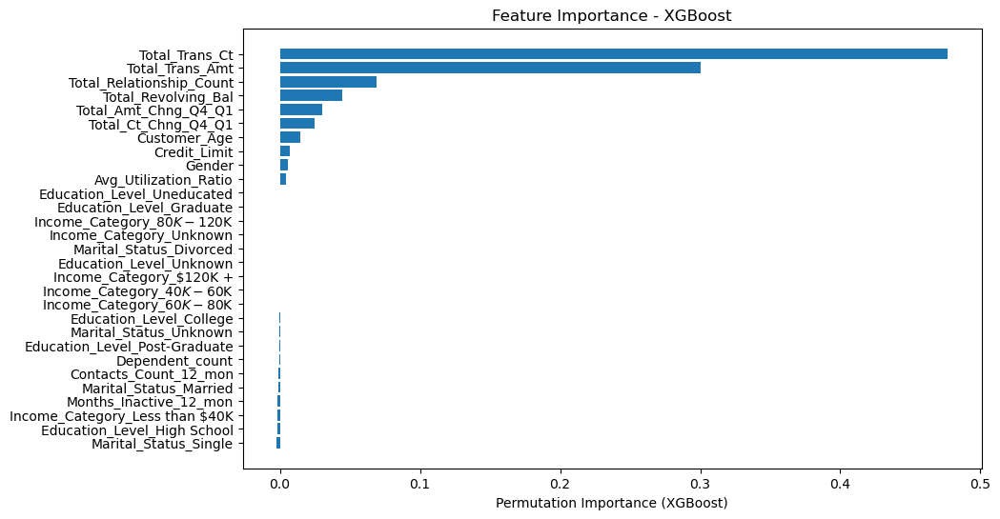

In [ ]:
plt.figure(figsize=(10, 6))
plt.barh(X_test.columns[sorted_idx_xgb], perm_importance_xgb.importances_mean[sorted_idx_xgb])
plt.xlabel("Permutation Importance (XGBoost)")
plt.title("Feature Importance - XGBoost")
plt.show()

In [ ]:
# SVM
perm_importance_svm = permutation_importance(best_svm_model, X_test_np, y_test, scoring='f1', n_repeats=10, random_state=42)
sorted_idx_svm = perm_importance_svm.importances_mean.argsort()

In [ ]:
feature_importance_svm = pd.DataFrame({
    'Feature': X_test.columns[sorted_idx_svm],
    'Importance': perm_importance_svm.importances_mean[sorted_idx_svm]
}).sort_values(by='Importance', ascending=False)
feature_importance_svm

,Feature,Importance
28,Total_Trans_Ct,0.464390
27,Total_Trans_Amt,0.207576
26,Total_Revolving_Bal,0.129734
25,Total_Ct_Chng_Q4_Q1,0.075045
24,Months_Inactive_12_mon,0.053764
23,Total_Relationship_Count,0.052905
22,Avg_Utilization_Ratio,0.036116
21,Total_Amt_Chng_Q4_Q1,0.034364
20,Dependent_count,0.022351
19,Contacts_Count_12_mon,0.019825


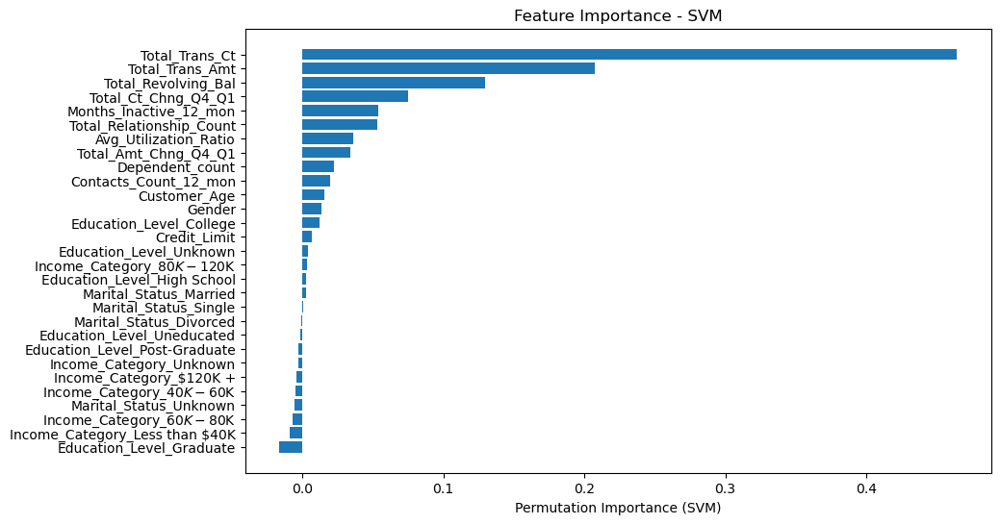

In [ ]:
plt.figure(figsize=(10, 6))
plt.barh(X_test.columns[sorted_idx_svm], perm_importance_svm.importances_mean[sorted_idx_svm])
plt.xlabel("Permutation Importance (SVM)")
plt.title("Feature Importance - SVM")
plt.show()

**Partial Dependence Plot (PDP)**<br>
Memahami hubungan antara suatu fitur dengan prediksi model, dengan cara melihat dampaknya ketika fitur tersebut bervariasi sementara fitur lainnya tetap.

In [ ]:
from sklearn.inspection import PartialDependenceDisplay
# fitur yang akan dianalisis
features_to_plot = ['Total_Trans_Ct', 'Total_Trans_Amt']

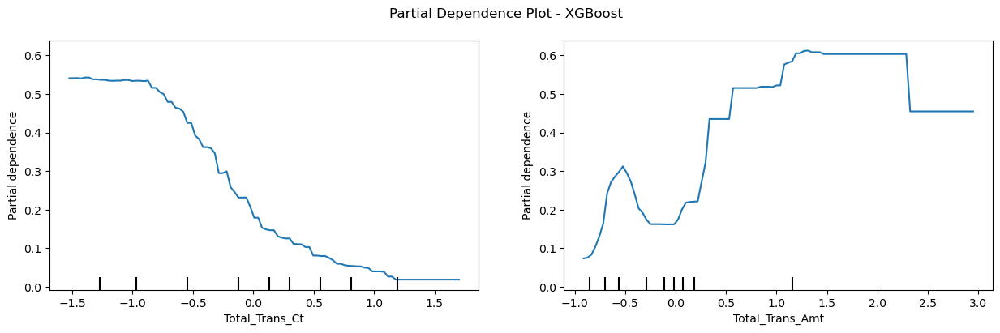

In [ ]:
# XGBoost
fig, ax = plt.subplots(nrows=1, ncols=len(features_to_plot), figsize=(15, 4))
PartialDependenceDisplay.from_estimator(best_xgb_model, X_test, features_to_plot, ax=ax)
fig.suptitle("Partial Dependence Plot - XGBoost")
plt.show()

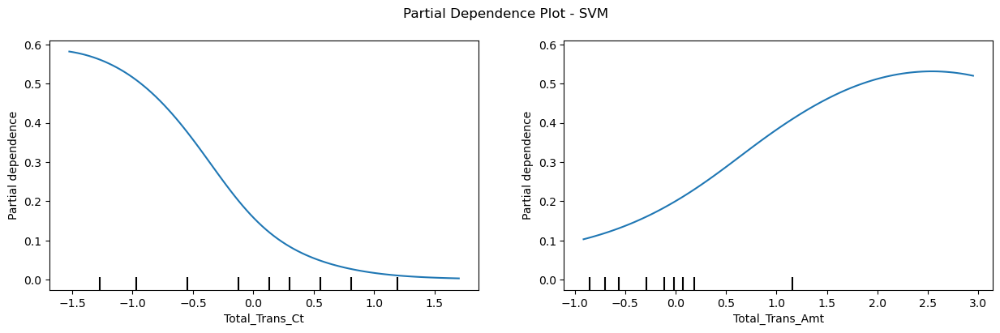

In [ ]:
# SVM
# Konversi fitur menjadi indeks karena X_test_np adalah NumPy array
feature_indices = [X_test.columns.get_loc(f) for f in features_to_plot]
fig, ax = plt.subplots(nrows=1, ncols=len(features_to_plot), figsize=(15, 4))
display = PartialDependenceDisplay.from_estimator(best_svm_model, X_test_np, feature_indices, ax=ax)
fig.suptitle("Partial Dependence Plot - SVM")
for i, axi in enumerate(ax):
    axi.set_xlabel(features_to_plot[i])
plt.show()

**SHAP (Shapley Additive Explanations)**<br>
Memberikan interpretasi kontribusi masing-masing fitur terhadap prediksi model.

In [ ]:
import shap

In [ ]:
## === SHAP untuk XGBoost ===
explainer_xgb = shap.Explainer(best_xgb_model, X_test)
shap_values_xgb = explainer_xgb(X_test)

 98%|===================| 991/1013 [00:16<00:00]        

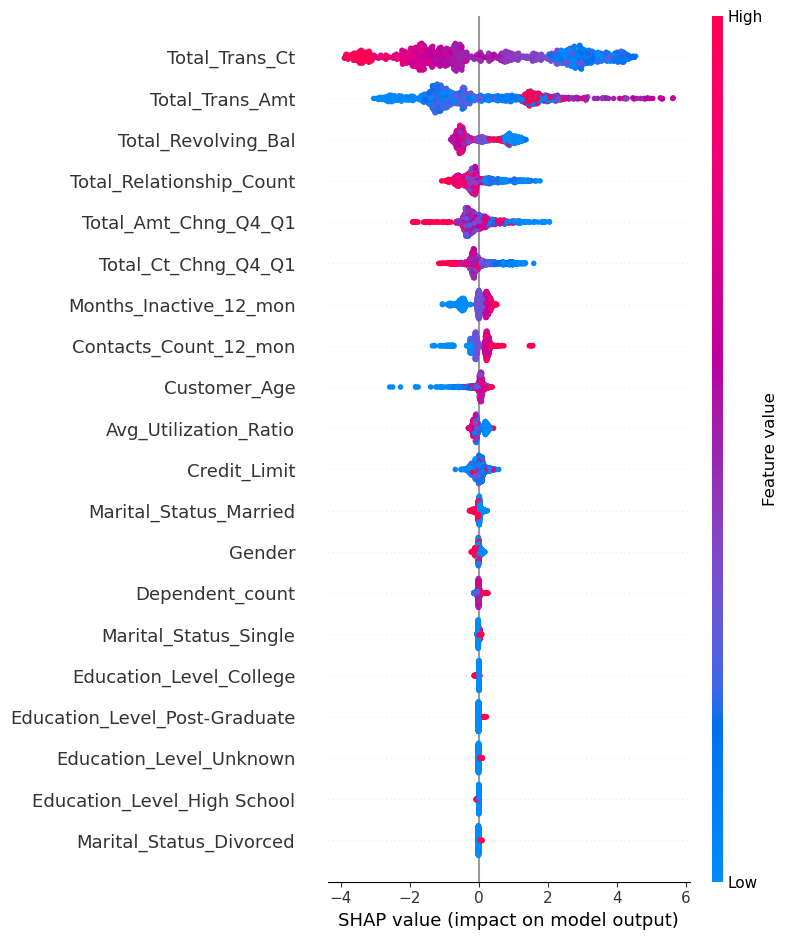

In [ ]:
# Summary Plot (Feature Importance)
shap.summary_plot(shap_values_xgb.values, X_test)

In [ ]:
# === SHAP untuk SVM ===
X_sample = X_test_np[:80]
explainer_svm = shap.KernelExplainer(best_svm_model.predict, X_sample)
shap_values_svm = explainer_svm.shap_values(X_sample, nsamples=80)

  0%|          | 0/80 [00:00<?, ?it/s]

In [ ]:
feature_names = X_test.columns

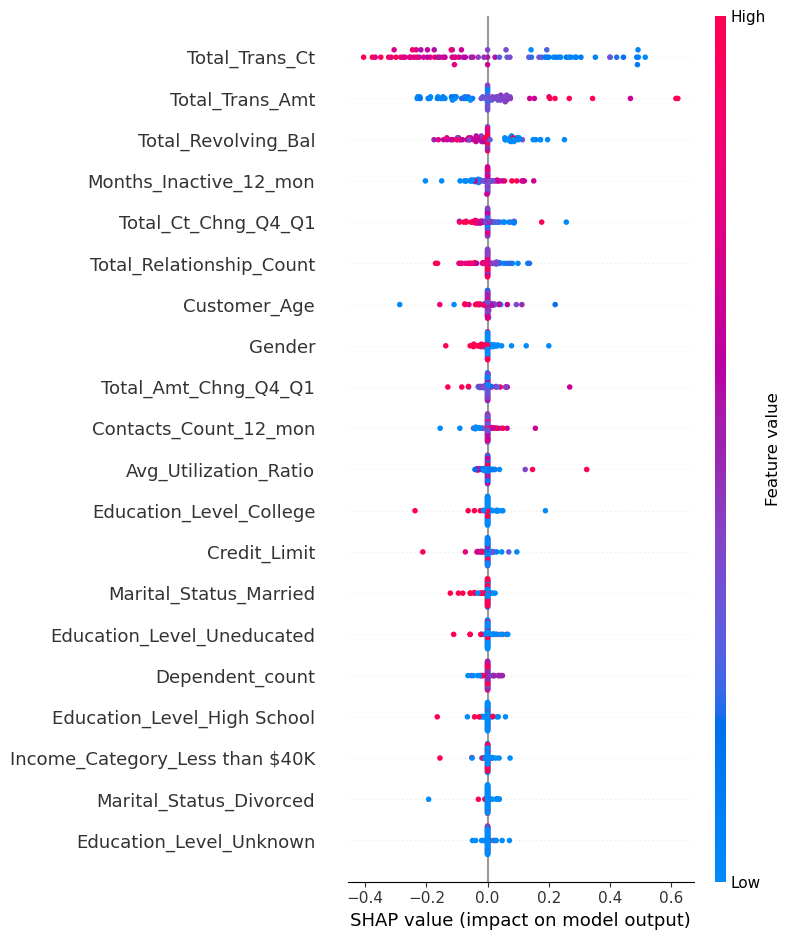

In [ ]:
# Summary Plot (Feature Importance)
shap.summary_plot(shap_values_svm, X_sample, feature_names=feature_names)

## `EVALUATION INTERPRETATION`

### Perbandingan Confusion Matrix pada Data Test


|             | Predicted 0 | Predicted 1 |
|-------------|--------------|--------------|
| **Actual 0** | TN           | FP           |
| **Actual 1** | FN           | TP           |

| **Model**   | **Actual** | **Predicted 0** | **Predicted 1** |  
|-------------|------------|-----------------|-----------------|  
| **XGBoost** | **0**      | 827             | 31              |  
|             | **1**      | 11              | 144             |  
| **SVM**     | **0**      | 822             | 36              |  
|             | **1**      | 35              | 120             |    

Kedua model menunjukkan perbedaan dalam prediksi pada dataset uji:
- **XGBoost** memiliki TP = 144 dan FN = 11, menunjukkan bahwa model ini sangat baik dalam mengenali pelanggan yang churn. Namun, terdapat FP = 23 dan TN = 827, yang berarti masih ada beberapa pelanggan non-churn yang diklasifikasikan sebagai churn.
- **SVM** memiliki TP = 120 dan FN = 35, yang berarti model ini masih cukup baik dalam mendeteksi pelanggan yang churn. Selain itu, dengan FP = 36 dan TN = 822, model ini masih kurang dibanding XGBoost dalam mengenali pelanggan non-churn.

### Perbandingan Accuracy pada Data Test

| **Model**   | **Accuracy (Decimal)** | **Accuracy (%)** |  
|------------|------------------------|------------------|  
| **XGBoost** | 0.9585                 | 95.85%           |  
| **SVM**     | 0.9299                 | 92.99%           |  

**XGBoost** memiliki Accuracy = 95.85%, menunjukkan kemampuannya dalam prediksi klasifikasi sudah sangat baik. Sedangkan, **SVM** juga menunjukan akurasi yang tinggi, memiliki Accuracy = 92.99% dalam prediksi dataset uji.

### Perbandingan Classification Report pada Data Test

| **Model**   | **Class** | **Precision** | **Recall** | **F1-Score** | **Support** |  
|------------|-----------|---------------|------------|--------------|-------------|  
| **XGBoost** | 0         | 0.99          | 0.96       | 0.98         | 858         |  
|             | 1         | 0.82          | **0.93**      | 0.87         | 155         |  
|             | **Accuracy** |           |            | **0.96**     | 1013        |  
|             | **Macro Avg** | 0.90      | 0.95       | 0.92         | 1013        |  
|             | **Weighted Avg** | 0.96   | 0.96       | 0.96         | 1013        |  
| **SVM**     | 0         | 0.96          | 0.96       | 0.96         | 858         |  
|             | 1         | 0.77          | **0.77**       | 0.77         | 155         |  
|             | **Accuracy** |           |            | **0.93**     | 1013        |  
|             | **Macro Avg** | 0.86      | 0.87       | 0.87         | 1013        |  
|             | **Weighted Avg** | 0.93   | 0.93       | 0.93         | 1013        |

XGBoost dengan akurasi 96%, dan Recall kelas 1 sebesar **0.93** dengan F1-score 0.87, menunjukkan kemampuannya sudah sangat baik dalam menangkap sebagian besar pelanggan yang churn. Untuk non-churn, XGBoost memiliki Precision sebesar 0.99 dan Recall 0.96 sedkit lebih tinggi dari kelas 1.

SVM memiliki akurasi 93%, dengan Recall kelas 1 sebesar **0.77** serta F1-score 0.77, menghasilkan performa yang baik dalam mendeteksi churn. Sedangkan pada non-churn, SVM memiliki Precision sebesar 0.96 dan Recall 0.96.

### Perbandingan Cross-Validation Scores pada Data Test

| **Model**   | **CV Fold 1** | **CV Fold 2** | **CV Fold 3** | **CV Fold 4** | **CV Fold 5** | **Mean CV Score** |
|------------|---------------|---------------|---------------|---------------|---------------|-------------------|
| **XGBoost** | 0.9557        | 0.9557        | 0.9458        | 0.9356        | 0.9406        | **0.9467**        |
| **SVM**     | 0.9015        | 0.8966        | 0.8916        | 0.9059        | 0.8960        | **0.8983**        |

XGBoost memiliki mean CV score lebih tinggi (**0.9368**) dibandingkan SVM (**0.8865**), menunjukkan performa yang lebih baik secara keseluruhan. XGBoost memberikan skor yang lebih konsisten di setiap fold, dengan rentang nilai antara 0.9261 hingga 0.9458, mencerminkan kemampuannya dalam menangkap pola dengan lebih efektif dibandingkan SVM, yang memiliki rentang nilai antara 0.8571 hingga 0.9059.

Fokus utama adalah **Recall** untuk kelas 1 karena tujuan utamanya mendeteksi churn.

Kedua model memiliki performa yang baik dalam memprediksi churn dan non-churn, dengan accuracy yang Tinggi (95.85% dan 92.99%). Dengan performa XGBoost lebih unggul untuk analisis churn karena:
- Recall dan F1-score lebih tinggi pada churn (kelas 1): XGBoost memiliki Recall 0.93 dengan F1-score 0.87, lebih baik dibandingkan SVM yang memiliki Recall 0.77 dan F1-score 0.77.
- Kinerja lebih stabil (Mean CV Score): XGBoost memiliki mean CV score sebesar 0.9467, lebih tinggi dibandingkan SVM yang memiliki 0.8983, menunjukkan konsistensi model dalam menangani data.

Karena **XGBoost** memiliki Recall lebih tinggi dalam mendeteksi churn serta performa yang lebih stabil, model ini lebih direkomendasikan untuk digunakan dalam analisis churn dibandingkan SVM.

### Explanatory Model Analysis (EMA)

| **Kategori**                | **XGBoost**                                                                                                                                                   | **SVM**                                                                                                                                                              | **Kesimpulan**                                                                                                                                                              |
|-----------------------------|---------------------------------------------------------------------------------------------------------------------------------------------------------------|-----------------------------------------------------------------------------------------------------------------------------------------------------------------------|-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Fitur Retensi Churn**     | Total_Trans_Ct, Total_Trans_Amt, Total_Relationship_Count, Total_Revolving_Bal                                                                                  | Total_Trans_Ct, Total_Trans_Amt, Total_Revolving_Bal, Total_Ct_Chng_Q4_Q1                                                                                               | Frekuensi dan nilai transaksi utama menunjukkan loyalitas. Pada SVM, perubahan jumlah transaksi (Total_Ct_Chng_Q4_Q1) juga menjadi indikator retensi.                         |
| **Fitur Pemicu Churn**      | Total_Amt_Chng_Q4_Q1, Months_Inactive_12_mon, Contacts_Count_12_mon, Credit_Limit                                                                               | Months_Inactive_12_mon, Contacts_Count_12_mon, Customer_Age, Avg_Utilization_Ratio                                                                                     | Perubahan pola transaksi dan berkurangnya interaksi (ditandai oleh peningkatan bulan tidak aktif dan kontak yang lebih sedikit) mengindikasikan potensi churn.              |
| **Fitur Tidak Berpengaruh** | Education_Level_Unknown, Education_Level_Graduate, Income_Category_Unknown                                                                                      | Income_Category_Unknown, Education_Level_Post-Graduate                                                                                                               | Variabel kategori pendidikan dan pendapatan cenderung memiliki pengaruh minimal terhadap churn dalam kedua model.                                                           |
| **Fitur Negatif**           | Marital_Status_Single, Education_Level_High School, Income_Category_Less than 40K<br>(fitur dengan nilai negatif lebih besar dalam XGBoost)                  | Education_Level_Graduate, Income_Category_Less than 40K, Income_Category_60K - 80K<br>(nilai negatif yang dominan menunjukkan kecenderungan risiko churn)          | Nilai negatif menunjukkan bahwa kenaikan fitur-fitur tersebut (yang berkaitan dengan demografi atau aspek interaksi tertentu) dapat dikaitkan dengan meningkatnya risiko churn. |
| **Perbedaan Model**         | Menitikberatkan volume dan nilai transaksi total sebagai indikator loyalitas.                                                                                  | Lebih menekankan dinamika perubahan (misalnya, perubahan jumlah transaksi) serta durasi tidak aktif.                                                                    | XGBoost lebih fokus pada aspek kuantitatif transaksi, sedangkan SVM menangkap dinamika perilaku yang berubah seiring waktu.                                                   |
| **Hubungan Fitur dengan Churn** | Pelanggan dengan transaksi yang konsisten dan hubungan relasional yang baik cenderung menunjukkan loyalitas yang lebih tinggi.                                | Pola transaksi yang berfluktuasi, terutama jika diiringi periode tidak aktif atau penurunan jumlah kontak, cenderung meningkatkan risiko churn.                           | Keterlibatan pelanggan secara aktif adalah kunci retensi; perubahan signifikan dalam perilaku transaksi dapat memicu kemungkinan churn.                                      |


### Rekomendasi Bisnis

| **Rekomendasi Bisnis**                                  | **Tindakan**                                                                                                                                                                                                                                                                                                               |
|---------------------------------------------------------|------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Dorong Peningkatan Frekuensi dan Nilai Transaksi**    | - Tingkatkan **Total_Trans_Ct** dan **Total_Trans_Amt** melalui program loyalitas, cashback, atau diskon khusus.<br> - Dorong pelanggan untuk bertransaksi lebih sering dengan penawaran eksklusif dan promosi terjadwal.                                                                                              |
| **Manajemen Saldo yang Seimbang**                       | - Pantau **Total_Revolving_Bal** untuk menghindari saldo bergulir yang tinggi.<br> - Berikan edukasi keuangan dan opsi penyesuaian limit kredit agar pelanggan dapat mengelola keuangan dengan lebih baik.                                                                                                                 |
| **Aktifkan Kembali Pelanggan yang Pasif**               | - Fokus pada **Months_Inactive_12_mon** dan **Contacts_Count_12_mon** untuk mengidentifikasi pelanggan yang jarang berinteraksi.<br> - Lakukan re-engagement melalui notifikasi, promo khusus, atau layanan konsultasi untuk mengembalikan minat dan aktivitas pelanggan.                                           |
| **Tingkatkan Keterlibatan Produk dan Layanan**          | - Maksimalkan **Total_Relationship_Count** dengan memperluas penawaran produk dan layanan.<br> - Terapkan strategi cross-selling dan bundling agar pelanggan mendapatkan manfaat lebih dari berbagai layanan yang tersedia.                                                                                           |
| **Pantau Perubahan Pola Perilaku Pelanggan**             | - Analisis **Total_Ct_Chng_Q4_Q1** dan **Total_Amt_Chng_Q4_Q1** untuk mendeteksi fluktuasi aktivitas transaksi.<br> - Lakukan intervensi dini jika terdeteksi penurunan atau ketidakstabilan pola transaksi, guna mencegah risiko churn.                                                                       |
| **Optimalkan Strategi Berdasarkan Aktivitas Pelanggan** | - Karena faktor pendapatan dan pendidikan terbukti tidak berpengaruh signifikan, fokuskan strategi pada perilaku dan aktivitas transaksi pelanggan.<br> - Personalisasi penawaran (seperti cashback dan diskon eksklusif) yang disesuaikan dengan kebiasaan bertransaksi untuk meningkatkan retensi. |
